In [7]:
# Importing all libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [8]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc

from sklearn.svm import SVC

In [9]:
path = 'UCI_Credit_Card.csv'
df = pd.read_csv(path)

In [10]:
df

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000.0,1,3,1,39,0,0,0,0,...,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0
29996,29997,150000.0,1,3,2,43,-1,-1,-1,-1,...,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0
29997,29998,30000.0,1,2,2,37,4,3,2,-1,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1
29998,29999,80000.0,1,3,1,41,1,-1,0,0,...,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0,1


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [15]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [16]:
df.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


# **Exploratory Data Analysis**

## **Dependent Variable:**

In [19]:
#renaming for better convinience
df['IsDefaulter'] =df ['default.payment.next.month']
df.drop('default.payment.next.month',axis = 1)
# df.rename({'default.payment.next.month' : 'IsDefaulter'}, inplace=True)

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,IsDefaulter
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000.0,1,3,1,39,0,0,0,0,...,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0
29996,29997,150000.0,1,3,2,43,-1,-1,-1,-1,...,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0
29997,29998,30000.0,1,2,2,37,4,3,2,-1,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1
29998,29999,80000.0,1,3,1,41,1,-1,0,0,...,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0,1


<Axes: xlabel='IsDefaulter', ylabel='count'>

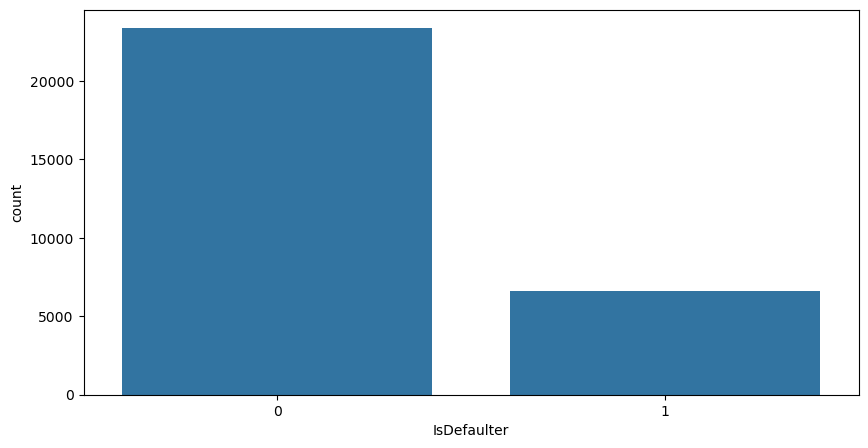

In [20]:
plt.figure(figsize=(10,5))
sns.countplot(x = 'IsDefaulter', data = df)

In [21]:
df['IsDefaulter'].value_counts()

IsDefaulter
0    23364
1     6636
Name: count, dtype: int64

### **Categorical  Features**

**SEX**



*   1 - Male
*   2 - Female


In [27]:
df['SEX'].value_counts()

SEX
2    18112
1    11888
Name: count, dtype: int64

**Education**



> 1 = graduate school; 2 = university; 3 = high school; 4 = others

In [29]:
df['EDUCATION'].value_counts()

EDUCATION
2    14030
1    10585
3     4917
5      280
4      123
6       51
0       14
Name: count, dtype: int64

In [31]:
fil = (df['EDUCATION'] == 5) | (df['EDUCATION'] == 6) | (df['EDUCATION'] == 0)
df.loc[fil, 'EDUCATION'] = 4
df['EDUCATION'].value_counts()

EDUCATION
2    14030
1    10585
3     4917
4      468
Name: count, dtype: int64

**Marriage**


> 1 = married; 2 = single; 3 = others

In [33]:
df['MARRIAGE'].value_counts()

MARRIAGE
2    15964
1    13659
3      323
0       54
Name: count, dtype: int64

We have few values for 0, which are not determined . So I am adding them in Others category.

In [35]:
fil = df['MARRIAGE'] == 0
df.loc[fil, 'MARRIAGE'] = 3
df['MARRIAGE'].value_counts()

MARRIAGE
2    15964
1    13659
3      377
Name: count, dtype: int64

**Plotting our categorical features**

In [37]:
categorical_features = ['SEX', 'EDUCATION', 'MARRIAGE']

In [38]:
df_cat = df[categorical_features]
df_cat['Defaulter'] = df['IsDefaulter']

In [39]:
df_cat.replace({'SEX': {1 : 'MALE', 2 : 'FEMALE'}, 'EDUCATION' : {1 : 'graduate school', 2 : 'university', 3 : 'high school', 4 : 'others'}, 'MARRIAGE' : {1 : 'married', 2 : 'single', 3 : 'others'}}, inplace = True)

<Figure size 1000x500 with 0 Axes>

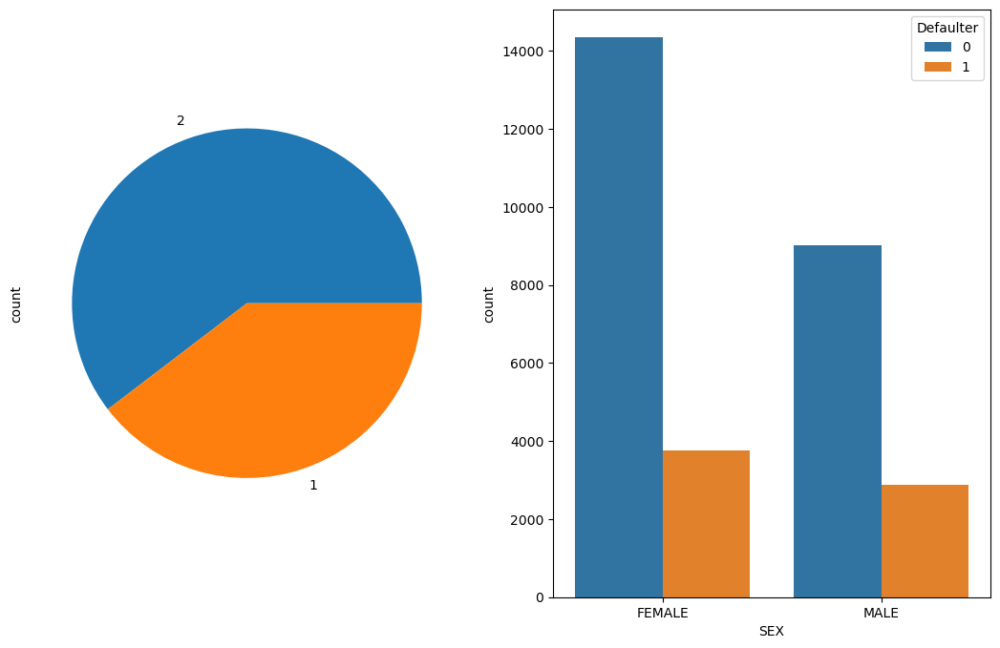

<Figure size 1000x500 with 0 Axes>

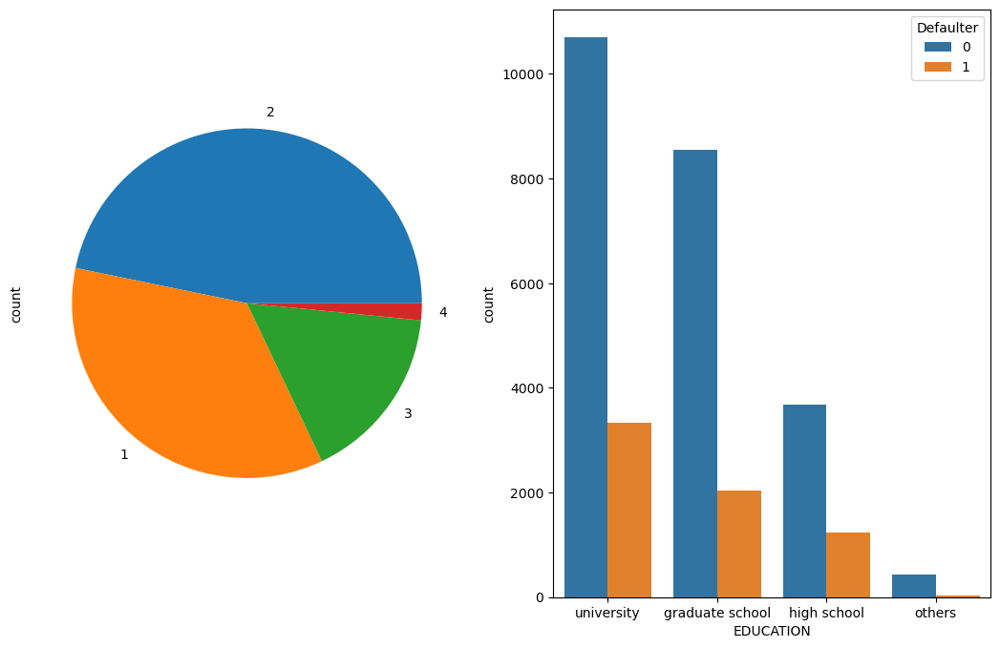

<Figure size 1000x500 with 0 Axes>

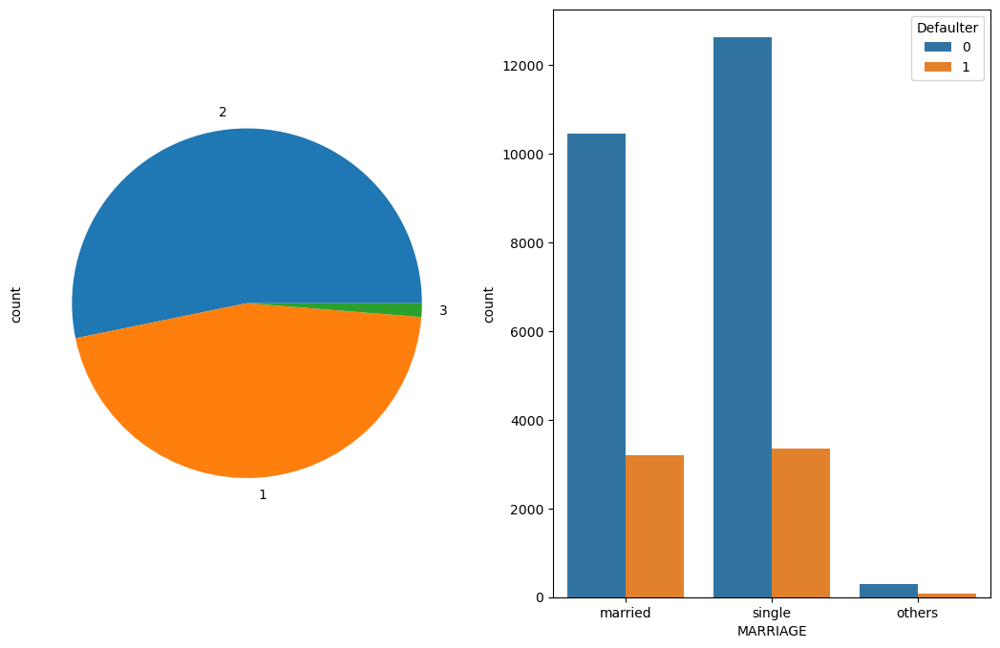

In [40]:
for col in categorical_features:
  plt.figure(figsize=(10,5))
  fig, axes = plt.subplots(ncols=2,figsize=(13,8))
  df[col].value_counts().plot(kind="pie",ax = axes[0],subplots=True)
  sns.countplot(x = col, hue = 'Defaulter', data = df_cat)

**Limit Balance**

In [43]:
df['LIMIT_BAL'].max()

1000000.0

In [44]:
df['LIMIT_BAL'].min()

10000.0

In [45]:
df['LIMIT_BAL'].describe()

count      30000.000000
mean      167484.322667
std       129747.661567
min        10000.000000
25%        50000.000000
50%       140000.000000
75%       240000.000000
max      1000000.000000
Name: LIMIT_BAL, dtype: float64

<Axes: xlabel='IsDefaulter', ylabel='LIMIT_BAL'>

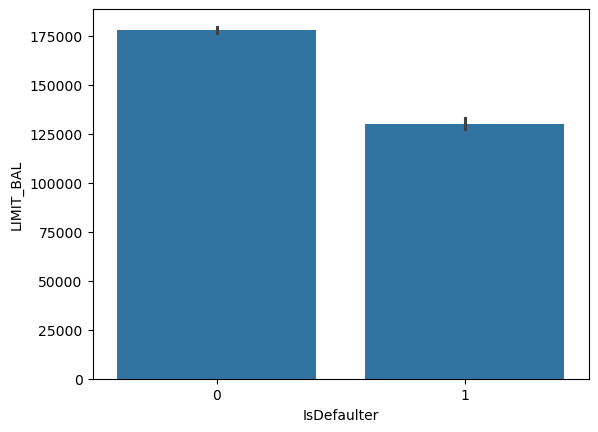

In [46]:
sns.barplot(x='IsDefaulter', y='LIMIT_BAL', data=df)

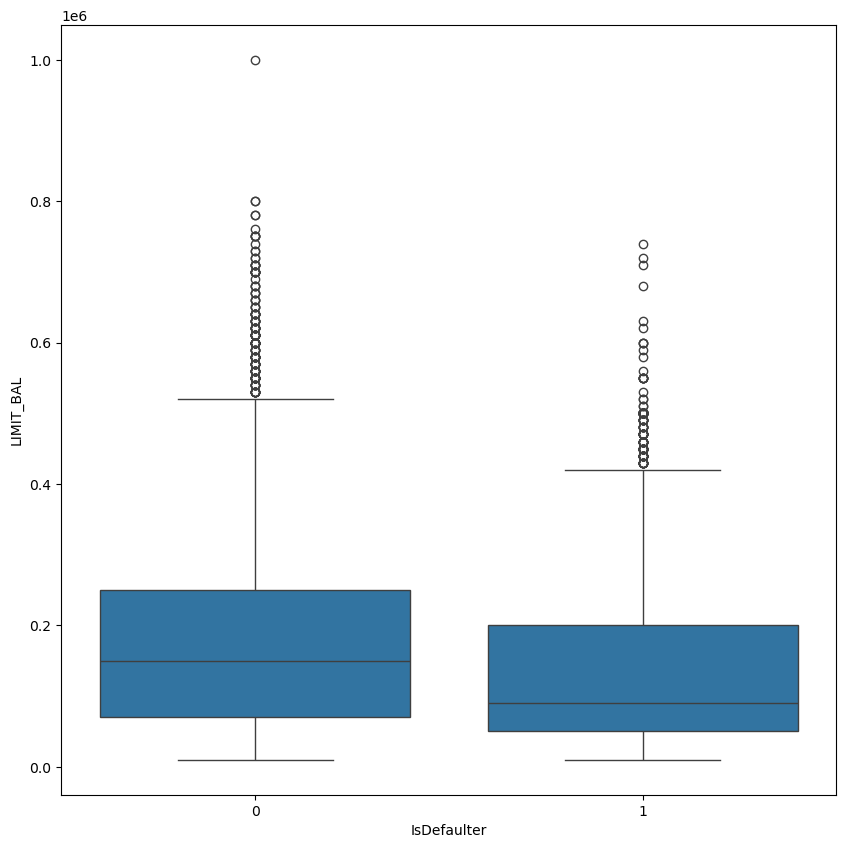

In [47]:
plt.figure(figsize=(10,10))
ax = sns.boxplot(x="IsDefaulter", y="LIMIT_BAL", data=df)

In [48]:
#renaming columns

df.rename(columns={'PAY_0':'PAY_SEPT','PAY_2':'PAY_AUG','PAY_3':'PAY_JUL','PAY_4':'PAY_JUN','PAY_5':'PAY_MAY','PAY_6':'PAY_APR'},inplace=True)
df.rename(columns={'BILL_AMT1':'BILL_AMT_SEPT','BILL_AMT2':'BILL_AMT_AUG','BILL_AMT3':'BILL_AMT_JUL','BILL_AMT4':'BILL_AMT_JUN','BILL_AMT5':'BILL_AMT_MAY','BILL_AMT6':'BILL_AMT_APR'}, inplace = True)
df.rename(columns={'PAY_AMT1':'PAY_AMT_SEPT','PAY_AMT2':'PAY_AMT_AUG','PAY_AMT3':'PAY_AMT_JUL','PAY_AMT4':'PAY_AMT_JUN','PAY_AMT5':'PAY_AMT_MAY','PAY_AMT6':'PAY_AMT_APR'},inplace=True)

In [49]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_SEPT,PAY_AUG,PAY_JUL,PAY_JUN,...,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,PAY_AMT_JUL,PAY_AMT_JUN,PAY_AMT_MAY,PAY_AMT_APR,default.payment.next.month,IsDefaulter
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0,0


**AGE**

In [52]:
df['AGE'].value_counts()

AGE
29    1605
27    1477
28    1409
30    1395
26    1256
31    1217
25    1186
34    1162
32    1158
33    1146
24    1127
35    1113
36    1108
37    1041
39     954
38     944
23     931
40     870
41     824
42     794
44     700
43     670
45     617
46     570
22     560
47     501
48     466
49     452
50     411
51     340
53     325
52     304
54     247
55     209
56     178
58     122
57     122
59      83
60      67
21      67
61      56
62      44
63      31
64      31
66      25
65      24
67      16
69      15
70      10
68       5
73       4
72       3
75       3
71       3
79       1
74       1
Name: count, dtype: int64

In [53]:
df['AGE']=df['AGE'].astype('int')

In [54]:
df.groupby('IsDefaulter')['AGE'].mean()

IsDefaulter
0    35.417266
1    35.725738
Name: AGE, dtype: float64

In [55]:
df = df.astype('int')

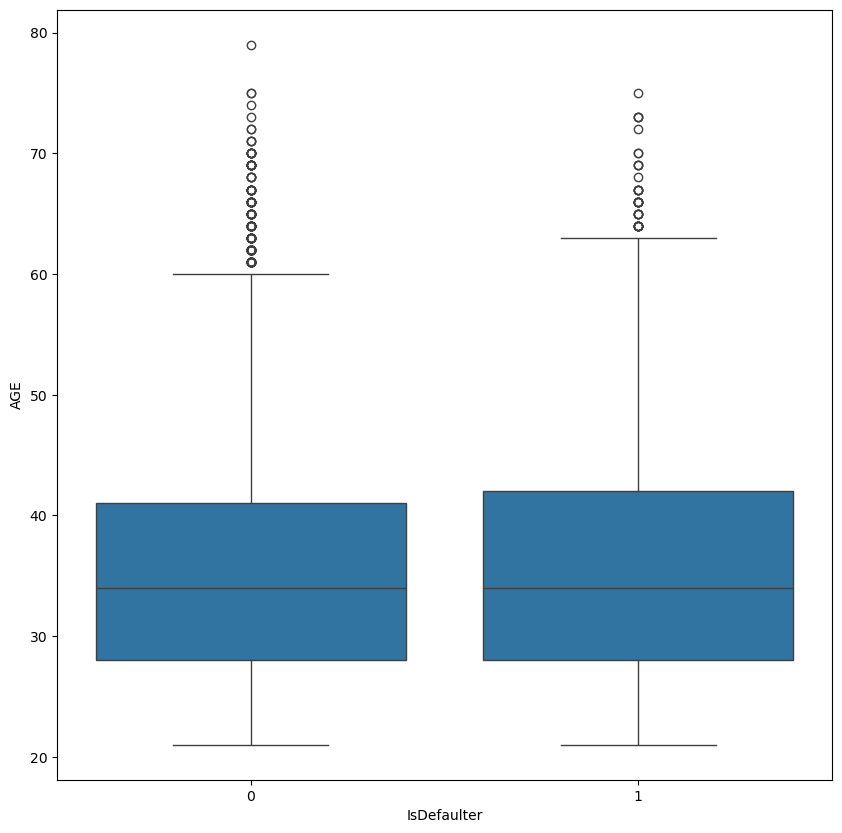

In [56]:
plt.figure(figsize=(10,10))
ax = sns.boxplot(x="IsDefaulter", y="AGE", data=df)

**Bill Amount**

In [58]:
bill_amnt_df = df[['BILL_AMT_SEPT',	'BILL_AMT_AUG',	'BILL_AMT_JUL',	'BILL_AMT_JUN',	'BILL_AMT_MAY',	'BILL_AMT_APR']]

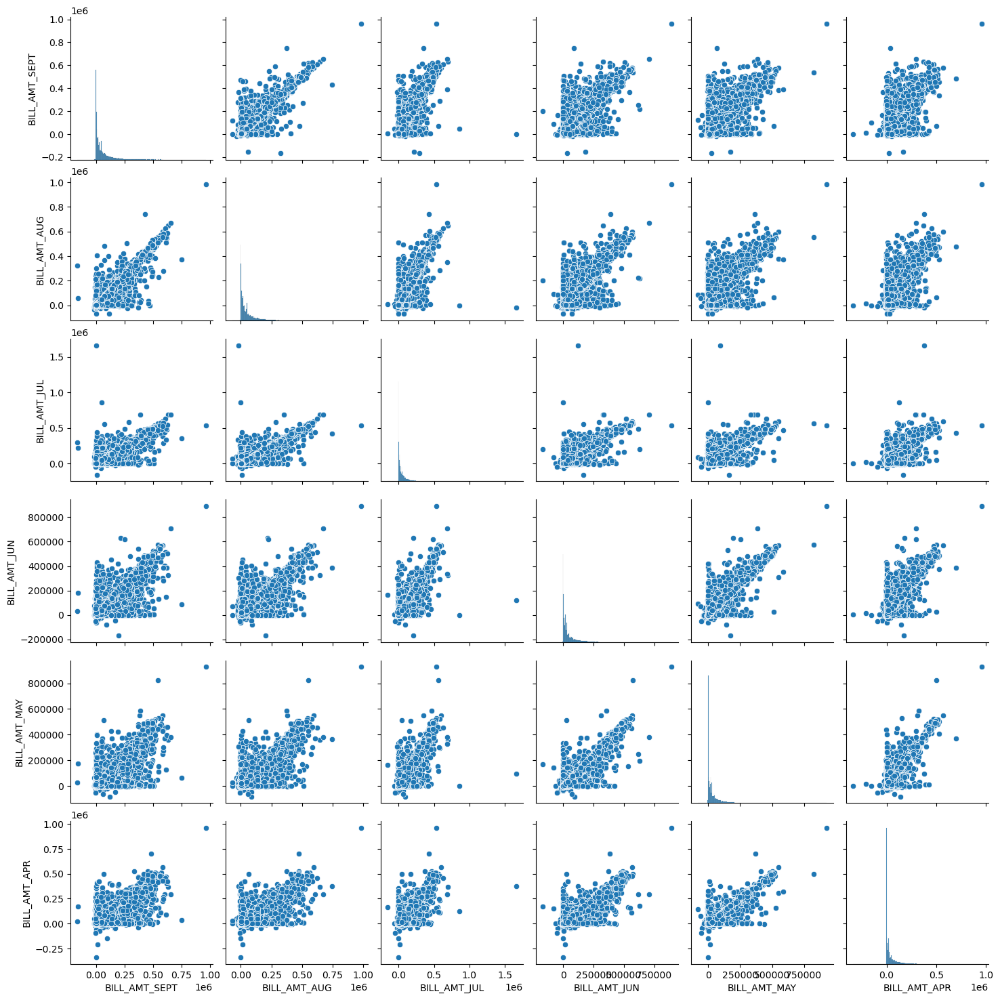

In [59]:
sns.pairplot(data = bill_amnt_df)

**History payment status**

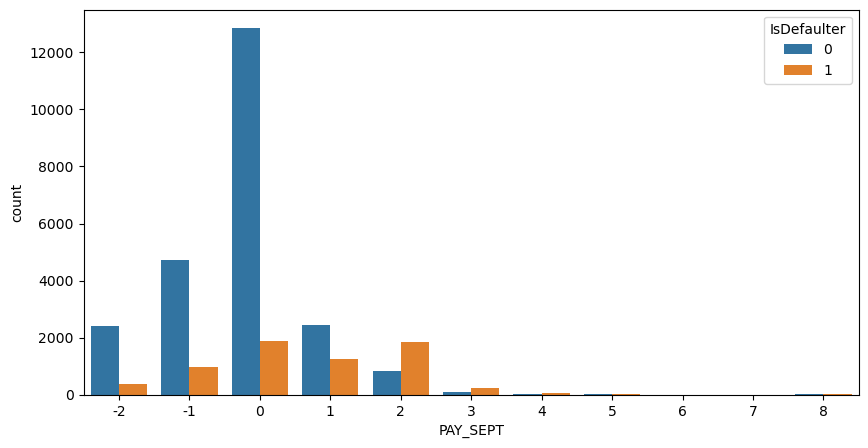

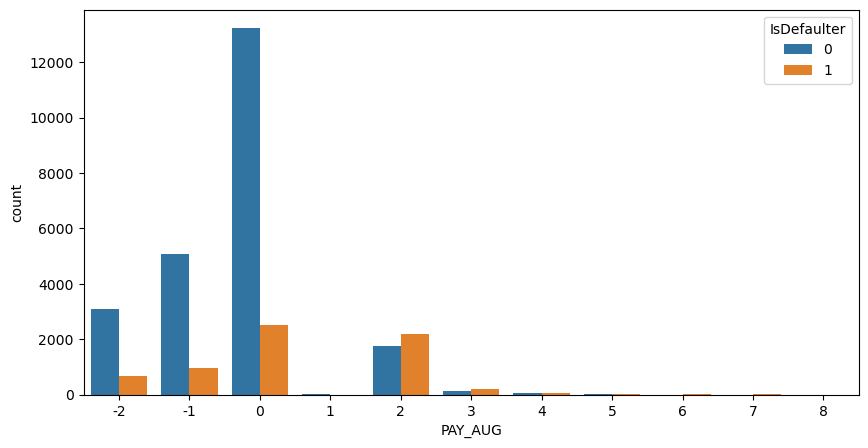

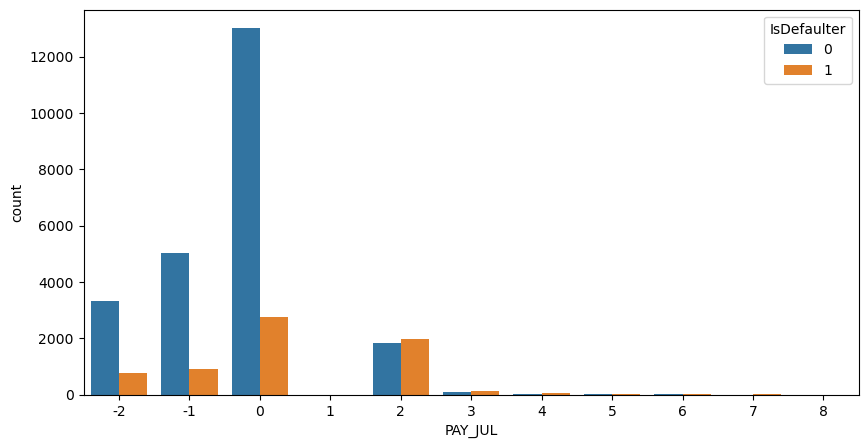

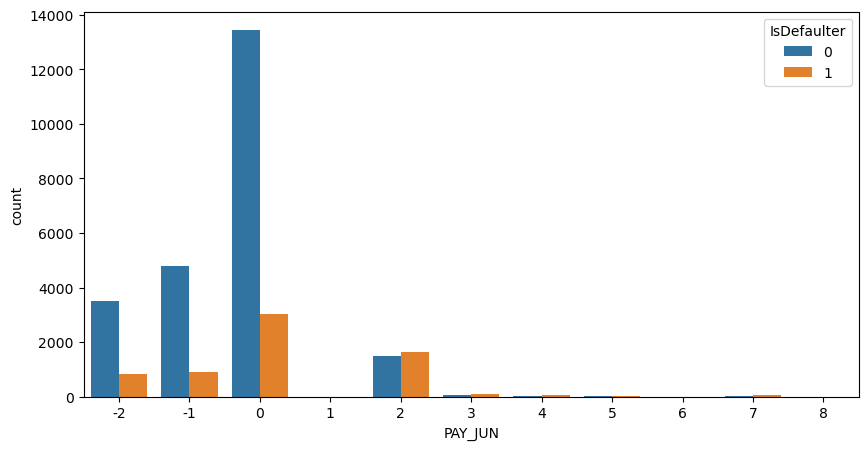

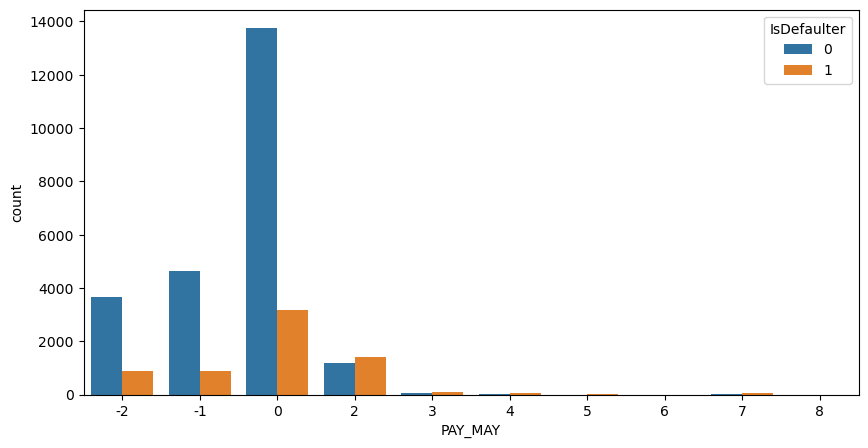

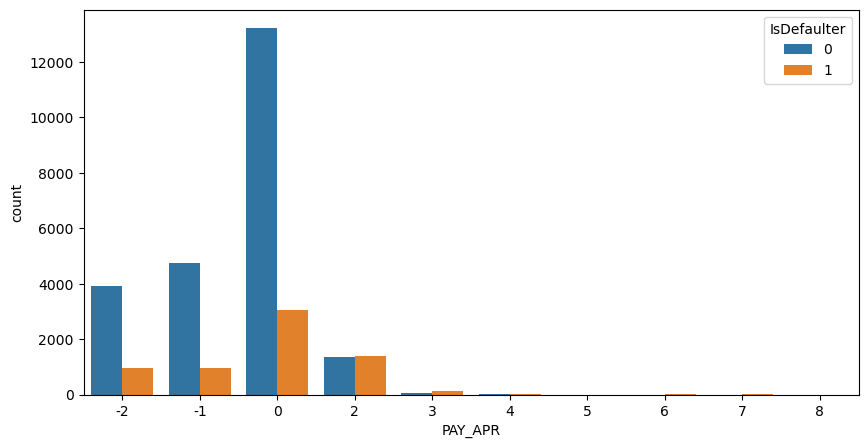

In [61]:
pay_col = ['PAY_SEPT',	'PAY_AUG',	'PAY_JUL',	'PAY_JUN',	'PAY_MAY',	'PAY_APR']
for col in pay_col:
  plt.figure(figsize=(10,5))
  sns.countplot(x = col, hue = 'IsDefaulter', data = df)

**Paid Amount**

In [63]:
pay_amnt_df = df[['PAY_AMT_SEPT',	'PAY_AMT_AUG',	'PAY_AMT_JUL',	'PAY_AMT_JUN',	'PAY_AMT_MAY',	'PAY_AMT_APR', 'IsDefaulter']]

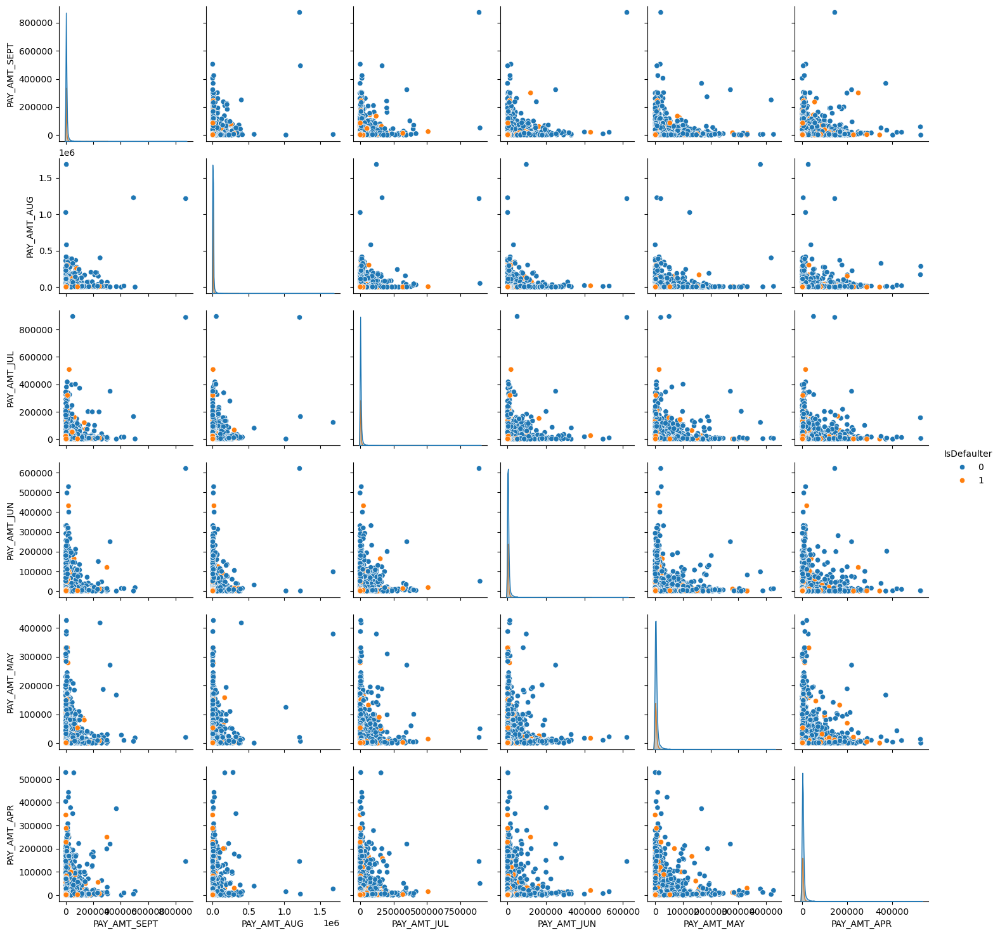

In [64]:
sns.pairplot(data = pay_amnt_df, hue='IsDefaulter')

In [65]:
df.shape

(30000, 26)

In [66]:
df


,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_SEPT,PAY_AUG,PAY_JUL,PAY_JUN,...,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,PAY_AMT_JUL,PAY_AMT_JUN,PAY_AMT_MAY,PAY_AMT_APR,default.payment.next.month,IsDefaulter
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,689,0,0,0,0,1,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3455,3261,0,1000,1000,1000,0,2000,1,1
2,3,90000,2,2,2,34,0,0,0,0,...,14948,15549,1518,1500,1000,1000,1000,5000,0,0
3,4,50000,2,2,1,37,0,0,0,0,...,28959,29547,2000,2019,1200,1100,1069,1000,0,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,19146,19131,2000,36681,10000,9000,689,679,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,31237,15980,8500,20000,5003,3047,5000,1000,0,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,5190,0,1837,3526,8998,129,0,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20582,19357,0,0,22000,4200,2000,3100,1,1
29998,29999,80000,1,3,1,41,1,-1,0,0,...,11855,48944,85900,3409,1178,1926,52964,1804,1,1


In [67]:
df=df.drop("default.payment.next.month",axis=1)

In [68]:
df

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_SEPT,PAY_AUG,PAY_JUL,PAY_JUN,...,BILL_AMT_JUN,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,PAY_AMT_JUL,PAY_AMT_JUN,PAY_AMT_MAY,PAY_AMT_APR,IsDefaulter
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,1,3,1,41,1,-1,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


In [69]:
df['IsDefaulter'].value_counts()

IsDefaulter
0    23364
1     6636
Name: count, dtype: int64

In [70]:
train, test = train_test_split(df, test_size=0.2, random_state=42)

print(train.shape)
print(test.shape)

(24000, 25)
(6000, 25)


In [71]:
X_train, y_train = train.drop('IsDefaulter', axis=1), train.IsDefaulter
X_test, y_test = test.drop('IsDefaulter', axis=1), test.IsDefaulter

## Scaling

In [73]:
from sklearn.preprocessing import MinMaxScaler

# Separating out the features and the target
da = df.drop('IsDefaulter', axis=1)
loan_status = df['IsDefaulter']


# Create an instance of MinMaxScaler
scaler = MinMaxScaler()

# Assuming 'data' is your DataFrame
scaled_data = scaler.fit_transform(da)

# Convert scaled_data back to a DataFrame
scaled_data_df = pd.DataFrame(scaled_data, columns=da.columns)



In [74]:
# Adding loan_status back to the scaled DataFrame using assign
scaled_data_df = scaled_data_df.assign(loan_status=loan_status.values)

# OR

# Using bracket notation
scaled_data_df['IsDefaulter'] = loan_status.values


In [75]:
print(scaled_data_df)

             ID  LIMIT_BAL  SEX  EDUCATION  MARRIAGE       AGE  PAY_SEPT  \
0      0.000000   0.010101  1.0   0.333333       0.0  0.051724       0.4   
1      0.000033   0.111111  1.0   0.333333       0.5  0.086207       0.1   
2      0.000067   0.080808  1.0   0.333333       0.5  0.224138       0.2   
3      0.000100   0.040404  1.0   0.333333       0.0  0.275862       0.2   
4      0.000133   0.040404  0.0   0.333333       0.0  0.620690       0.1   
...         ...        ...  ...        ...       ...       ...       ...   
29995  0.999867   0.212121  0.0   0.666667       0.0  0.310345       0.2   
29996  0.999900   0.141414  0.0   0.666667       0.5  0.379310       0.1   
29997  0.999933   0.020202  0.0   0.333333       0.5  0.275862       0.6   
29998  0.999967   0.070707  0.0   0.666667       0.0  0.344828       0.3   
29999  1.000000   0.040404  0.0   0.333333       0.0  0.431034       0.2   

       PAY_AUG  PAY_JUL  PAY_JUN  ...  BILL_AMT_MAY  BILL_AMT_APR  \
0          0.4    

In [76]:
scaled_data_df['IsDefaulter'].value_counts()

IsDefaulter
0    23364
1     6636
Name: count, dtype: int64

In [77]:
scaled_data_df=scaled_data_df.drop("loan_status",axis=1)

In [78]:
scaled_data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ID             30000 non-null  float64
 1   LIMIT_BAL      30000 non-null  float64
 2   SEX            30000 non-null  float64
 3   EDUCATION      30000 non-null  float64
 4   MARRIAGE       30000 non-null  float64
 5   AGE            30000 non-null  float64
 6   PAY_SEPT       30000 non-null  float64
 7   PAY_AUG        30000 non-null  float64
 8   PAY_JUL        30000 non-null  float64
 9   PAY_JUN        30000 non-null  float64
 10  PAY_MAY        30000 non-null  float64
 11  PAY_APR        30000 non-null  float64
 12  BILL_AMT_SEPT  30000 non-null  float64
 13  BILL_AMT_AUG   30000 non-null  float64
 14  BILL_AMT_JUL   30000 non-null  float64
 15  BILL_AMT_JUN   30000 non-null  float64
 16  BILL_AMT_MAY   30000 non-null  float64
 17  BILL_AMT_APR   30000 non-null  float64
 18  PAY_AM

In [79]:
X = scaled_data_df.drop(['IsDefaulter'],axis=1)
y = scaled_data_df['IsDefaulter']

In [80]:
X

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_SEPT,PAY_AUG,PAY_JUL,PAY_JUN,...,BILL_AMT_JUL,BILL_AMT_JUN,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,PAY_AMT_JUL,PAY_AMT_JUN,PAY_AMT_MAY,PAY_AMT_APR
0,0.000000,0.010101,1.0,0.333333,0.0,0.051724,0.4,0.4,0.1,0.1,...,0.086723,0.160138,0.080648,0.260979,0.000000,0.000409,0.000000,0.000000,0.000000,0.000000
1,0.000033,0.111111,1.0,0.333333,0.5,0.086207,0.1,0.4,0.2,0.2,...,0.087817,0.163220,0.084074,0.263485,0.000000,0.000594,0.001116,0.001610,0.000000,0.003783
2,0.000067,0.080808,1.0,0.333333,0.5,0.224138,0.2,0.2,0.2,0.2,...,0.093789,0.173637,0.095470,0.272928,0.001738,0.000891,0.001116,0.001610,0.002345,0.009458
3,0.000100,0.040404,1.0,0.333333,0.0,0.275862,0.2,0.2,0.2,0.2,...,0.113407,0.186809,0.109363,0.283685,0.002290,0.001199,0.001339,0.001771,0.002506,0.001892
4,0.000133,0.040404,0.0,0.333333,0.0,0.620690,0.1,0.2,0.1,0.2,...,0.106020,0.179863,0.099633,0.275681,0.002290,0.021779,0.011160,0.014493,0.001615,0.001284
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,0.999867,0.212121,0.0,0.666667,0.0,0.310345,0.2,0.2,0.2,0.2,...,0.200746,0.243036,0.111622,0.273259,0.009730,0.011875,0.005583,0.004907,0.011723,0.001892
29996,0.999900,0.141414,0.0,0.666667,0.5,0.379310,0.1,0.1,0.1,0.1,...,0.088267,0.168596,0.085794,0.260979,0.002103,0.002094,0.010042,0.000208,0.000000,0.000000
29997,0.999933,0.020202,0.0,0.333333,0.5,0.275862,0.6,0.5,0.4,0.1,...,0.087859,0.179805,0.101057,0.275854,0.000000,0.000000,0.024552,0.006763,0.004689,0.005864
29998,0.999967,0.070707,0.0,0.666667,0.0,0.344828,0.3,0.1,0.2,0.2,...,0.128239,0.209850,0.092403,0.298591,0.098334,0.002024,0.001315,0.003101,0.124174,0.003412


In [81]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [82]:
train, test = train_test_split(scaled_data_df, test_size=0.2, random_state=42)

print(train.shape)
print(test.shape)

(24000, 25)
(6000, 25)


In [83]:
train

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_SEPT,PAY_AUG,PAY_JUL,PAY_JUN,...,BILL_AMT_JUN,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,PAY_AMT_JUL,PAY_AMT_JUN,PAY_AMT_MAY,PAY_AMT_APR,IsDefaulter
21753,0.725124,0.070707,1.0,0.333333,0.5,0.051724,0.2,0.2,0.2,0.2,...,0.229591,0.119957,0.291301,0.004010,0.002969,0.002335,0.001961,0.003388,0.001661,0
251,0.008367,0.020202,0.0,0.333333,0.5,0.120690,0.2,0.2,0.2,0.2,...,0.183928,0.102464,0.260979,0.005731,0.000739,0.000950,0.001538,0.000000,0.000000,0
22941,0.764725,0.171717,1.0,1.000000,0.0,0.396552,0.2,0.2,0.1,0.1,...,0.160138,0.087471,0.268925,0.000000,0.000505,0.000000,0.011081,0.024242,0.000344,0
618,0.020601,0.050505,0.0,0.000000,0.5,0.068966,0.2,0.2,0.2,0.2,...,0.197477,0.119933,0.291057,0.002310,0.001128,0.002232,0.002415,0.004455,0.003783,0
17090,0.569686,0.121212,1.0,0.333333,0.5,0.068966,0.2,0.2,0.2,0.2,...,0.271125,0.200483,0.356197,0.004693,0.002494,0.005580,0.008052,0.011723,0.020240,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29802,0.993433,0.040404,0.0,0.333333,0.5,0.189655,0.2,0.2,0.2,0.2,...,0.212849,0.109640,0.265681,0.002290,0.001781,0.001776,0.000116,0.002659,0.138880,0
5390,0.179673,0.191919,0.0,0.000000,0.5,0.275862,0.4,0.4,0.4,0.4,...,0.314795,0.248252,0.393222,0.015454,0.003562,0.000000,0.012077,0.014067,0.007566,1
860,0.028668,0.040404,0.0,0.000000,0.5,0.086207,0.0,0.0,0.0,0.0,...,0.160138,0.080648,0.260979,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0
15795,0.526518,0.060606,1.0,0.333333,0.5,0.068966,0.2,0.2,0.2,0.2,...,0.193222,0.109040,0.282526,0.003434,0.001187,0.005022,0.001932,0.000000,0.002270,1


In [84]:
X_train, y_train = train.drop('IsDefaulter', axis=1), train.IsDefaulter
X_test, y_test = test.drop('IsDefaulter', axis=1), test.IsDefaulter

In [85]:
X_train

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_SEPT,PAY_AUG,PAY_JUL,PAY_JUN,...,BILL_AMT_JUL,BILL_AMT_JUN,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,PAY_AMT_JUL,PAY_AMT_JUN,PAY_AMT_MAY,PAY_AMT_APR
21753,0.725124,0.070707,1.0,0.333333,0.5,0.051724,0.2,0.2,0.2,0.2,...,0.129346,0.229591,0.119957,0.291301,0.004010,0.002969,0.002335,0.001961,0.003388,0.001661
251,0.008367,0.020202,0.0,0.333333,0.5,0.120690,0.2,0.2,0.2,0.2,...,0.102352,0.183928,0.102464,0.260979,0.005731,0.000739,0.000950,0.001538,0.000000,0.000000
22941,0.764725,0.171717,1.0,1.000000,0.0,0.396552,0.2,0.2,0.1,0.1,...,0.086811,0.160138,0.087471,0.268925,0.000000,0.000505,0.000000,0.011081,0.024242,0.000344
618,0.020601,0.050505,0.0,0.000000,0.5,0.068966,0.2,0.2,0.2,0.2,...,0.107501,0.197477,0.119933,0.291057,0.002310,0.001128,0.002232,0.002415,0.004455,0.003783
17090,0.569686,0.121212,1.0,0.333333,0.5,0.068966,0.2,0.2,0.2,0.2,...,0.149338,0.271125,0.200483,0.356197,0.004693,0.002494,0.005580,0.008052,0.011723,0.020240
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29802,0.993433,0.040404,0.0,0.333333,0.5,0.189655,0.2,0.2,0.2,0.2,...,0.116948,0.212849,0.109640,0.265681,0.002290,0.001781,0.001776,0.000116,0.002659,0.138880
5390,0.179673,0.191919,0.0,0.000000,0.5,0.275862,0.4,0.4,0.4,0.4,...,0.178796,0.314795,0.248252,0.393222,0.015454,0.003562,0.000000,0.012077,0.014067,0.007566
860,0.028668,0.040404,0.0,0.000000,0.5,0.086207,0.0,0.0,0.0,0.0,...,0.086345,0.160138,0.080648,0.260979,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
15795,0.526518,0.060606,1.0,0.333333,0.5,0.068966,0.2,0.2,0.2,0.2,...,0.114429,0.193222,0.109040,0.282526,0.003434,0.001187,0.005022,0.001932,0.000000,0.002270


## GAN

In [87]:
df_default= scaled_data_df.loc[scaled_data_df['IsDefaulter']==1]
df_paid=scaled_data_df.loc[scaled_data_df['IsDefaulter']==0]

In [88]:
df_default = df_default.drop(['IsDefaulter'], axis=1)
df_paid=df_paid.drop(['IsDefaulter'], axis=1)

In [89]:
df_paid.shape

(23364, 24)

In [90]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, ReLU, LeakyReLU , BatchNormalization
from tensorflow.keras import Model
from tensorflow.keras.optimizers import RMSprop

class GAN():
    def __init__(self, gan_args):
        [self.batch_size, lr, self.noise_dim, self.data_dim, layers_dim] = gan_args
        self.n_discriminator = 2  # number of discriminator updates per generator update

        # Initialize discriminator and generator
        self.discriminator = self.build_discriminator()
        self.generator = self.build_generator()

        # Create the combined model
        z = Input(shape=(self.noise_dim,))
        record = self.generator(z)
        self.discriminator.trainable = False
        validity = self.discriminator(record)
        self.combined = Model(z, validity)
        self.combined.compile(loss='binary_crossentropy',
                              optimizer=RMSprop(learning_rate=lr, clipvalue=1.0),
                              metrics=['accuracy'])

        # Now compile the discriminator
        self.discriminator.trainable = True
        self.discriminator.compile(loss='binary_crossentropy',
                                   optimizer=RMSprop(learning_rate=lr, clipvalue=1.0),
                                   metrics=['accuracy'])

    def train(self, data, train_arguments):
        [cache_prefix, epochs, sample_interval] = train_arguments
        valid = 1 * np.ones((self.batch_size, 1))
        fake = 0 * np.ones((self.batch_size, 1))
        noise_factor = 0.05

        for epoch in range(epochs):
            # Discriminator updates
            for _ in range(self.n_discriminator):
                batch_data = self.get_data_batch(data, self.batch_size)
                batch_data_noisy = batch_data + noise_factor * tf.random.normal(shape=batch_data.shape)
                noise = tf.random.normal((self.batch_size, self.noise_dim))
                gen_data = self.generator.predict(noise)
                gen_data_noisy = gen_data + noise_factor * tf.random.normal(shape=gen_data.shape)
                d_loss_real = self.discriminator.train_on_batch(batch_data_noisy, valid)
                d_loss_fake = self.discriminator.train_on_batch(gen_data_noisy, fake)
                d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # Generator update
            noise = tf.random.normal((self.batch_size, self.noise_dim))
            g_loss = self.combined.train_on_batch(noise, valid)
            print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f, acc.: %.2f%%]" % (epoch, d_loss[0], 100 * d_loss[1], g_loss[0], 100 * g_loss[1]))



# Adjust the discriminator model
    def build_discriminator(self):
        input_layer = Input(shape=(self.data_dim,))
        x = Dense(128)(input_layer)
        x = LeakyReLU(alpha=0.2)(x)
        x = Dropout(0.2)(x)
        x = Dense(64)(x)
        x = LeakyReLU(alpha=0.2)(x)
        x = Dropout(0.2)(x)
        x = Dense(32)(x)  # Add another layer for more complexity
        x = LeakyReLU(alpha=0.2)(x)
        x = Dropout(0.2)(x)
        x = Dense(18)(x)  # Add another layer for more complexity
        x = LeakyReLU(alpha=0.2)(x)
        x = Dropout(0.2)(x)
        x = Dense(1, activation='sigmoid')(x)
        return Model(input_layer, x)

    # Adjust the generator model
    def build_generator(self):
        input_layer = Input(shape=(self.noise_dim,))
        x = Dense(256)(input_layer)  # More nodes for initial layer
        x = ReLU()(x)
        x = BatchNormalization(momentum=0.8)(x)
       # x = Dense(512)(x)  # Added another dense layer
        #x = ReLU()(x)
        #x = BatchNormalization(momentum=0.8)(x)
        x = Dense(256)(x)
        x = ReLU()(x)
        x = BatchNormalization(momentum=0.8)(x)
        x = Dense(128)(x)
        x = ReLU()(x)
        x = BatchNormalization(momentum=0.8)(x)
        x = Dense(self.data_dim, activation='sigmoid')(x)
        return Model(input_layer, x)


    def get_data_batch(self, train, batch_size, seed=0):
        start_i = (batch_size * seed) % len(train)
        stop_i = start_i + batch_size
        shuffle_seed = (batch_size * seed) // len(train)
        np.random.seed(shuffle_seed)
        train_ix = np.random.choice(list(train.index), replace=False, size=len(train))
        train_ix = list(train_ix) + list(train_ix)
        x = train.loc[train_ix[start_i: stop_i]].values
        return np.reshape(x, (batch_size, -1))

batch_size = 28
learning_rate = 0.00001  # Use either this one...
# learning_rate_g =0.0002
# learning_rate_d =0.0002
noise_shape =30
input_shape = 24
dim = 128
epochs =500
log_step = 50

In [91]:
generator_parameters = [batch_size, learning_rate, noise_shape, input_shape, dim]
training_parameters = ['', epochs, log_step]



In [92]:
# training
synthesizer = GAN(generator_parameters)
# change passed in dataframe to select which class is to be generated

synthesizer.train(df_default,training_parameters)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
0 [D loss: 0.656766, acc.: 66.67%] [G loss: 0.650770, acc.: 65.08%]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1 [D loss: 0.654564, acc.: 67.12%] [G loss: 0.653173, acc.: 65.32%]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
2 [D loss: 0.654279, acc.: 65.96%] [G loss: 0.652296, acc.: 65.23%]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
3 [D loss: 0.653073, acc.: 64.75%] [G loss: 0.652226, acc.: 65.22%]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
4 [D loss: 0.655236, acc.: 64.29%] [G loss: 0.655527, acc.: 65.55%]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
5 [D loss: 0.656025, acc.: 63.67%] [G loss: 0.655112, acc.: 65.51%]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6 [D loss: 0.656642, acc.: 63.24%] [G loss: 0.655805, acc.: 65.

In [93]:
models = {'GAN': ['GAN', False, synthesizer.generator]}


In [94]:
np.random.seed(17) # used for retestability

noise = np.random.normal(0,1, (16728, 30))

[model_name, with_class, generator_model] = models['GAN']

X = generator_model.predict(noise)

523/523 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


In [95]:
default_sample = pd.DataFrame(X, columns=df_default.columns)

In [96]:
df_default.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_SEPT,PAY_AUG,PAY_JUL,PAY_JUN,...,BILL_AMT_JUL,BILL_AMT_JUN,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,PAY_AMT_JUL,PAY_AMT_JUN,PAY_AMT_MAY,PAY_AMT_APR
count,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,...,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000,6636.000000
mean,0.492442,0.121323,0.567058,0.296514,0.265145,0.253892,0.266817,0.245826,0.236212,0.225452,...,0.111151,0.199736,0.119855,0.290390,0.003889,0.002012,0.003758,0.005082,0.007547,0.006510
std,0.285730,0.116544,0.495520,0.235934,0.262654,0.167128,0.138325,0.150224,0.149940,0.150853,...,0.037619,0.060618,0.060907,0.045786,0.010926,0.006969,0.014463,0.018023,0.028004,0.025468
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.052575,0.098751,0.028088,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.246925,0.040404,0.000000,0.000000,0.000000,0.120690,0.200000,0.200000,0.100000,0.100000,...,0.087717,0.162155,0.082138,0.261862,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.491933,0.080808,1.000000,0.333333,0.500000,0.224138,0.300000,0.200000,0.200000,0.200000,...,0.097235,0.178148,0.098971,0.274833,0.001873,0.000910,0.001364,0.001610,0.002345,0.001892
75%,0.727716,0.191919,1.000000,0.333333,0.500000,0.362069,0.400000,0.400000,0.400000,0.400000,...,0.116396,0.207403,0.128098,0.297423,0.003982,0.001965,0.003348,0.004733,0.007034,0.005626
max,1.000000,0.737374,1.000000,1.000000,1.000000,0.931034,1.000000,0.900000,1.000000,1.000000,...,0.404224,0.676365,0.623908,0.656728,0.343425,0.212965,0.567195,0.695862,0.778376,0.653140


In [97]:
default_sample.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_SEPT,PAY_AUG,PAY_JUL,PAY_JUN,...,BILL_AMT_JUL,BILL_AMT_JUN,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,PAY_AMT_JUL,PAY_AMT_JUN,PAY_AMT_MAY,PAY_AMT_APR
count,16728.000000,16728.000000,16728.000000,16728.000000,16728.000000,16728.000000,16728.000000,16728.000000,16728.000000,16728.000000,...,16728.000000,16728.000000,16728.000000,16728.000000,16728.000000,16728.000000,16728.000000,16728.000000,16728.000000,16728.000000
mean,0.493132,0.503461,0.529812,0.504062,0.521218,0.504527,0.501087,0.503809,0.487614,0.471070,...,0.501363,0.513252,0.509879,0.481761,0.500423,0.512754,0.499294,0.502903,0.503847,0.491277
std,0.253053,0.242315,0.228944,0.273565,0.256175,0.243271,0.283762,0.225656,0.264578,0.261716,...,0.272241,0.271130,0.270159,0.243973,0.234041,0.252178,0.237478,0.234881,0.229804,0.244973
min,0.000883,0.003599,0.000995,0.001104,0.002769,0.009207,0.002634,0.020869,0.005116,0.000149,...,0.002354,0.000510,0.002586,0.003813,0.003432,0.003782,0.007258,0.005176,0.007188,0.003033
25%,0.282810,0.309278,0.355313,0.270234,0.310275,0.304509,0.252650,0.321477,0.262957,0.249082,...,0.269729,0.281598,0.279801,0.280135,0.315219,0.305595,0.306773,0.316259,0.323098,0.294564
50%,0.493519,0.506719,0.542732,0.508168,0.527292,0.503042,0.488230,0.495445,0.474765,0.474024,...,0.496306,0.527962,0.509778,0.472992,0.503337,0.514712,0.493158,0.503199,0.501742,0.495280
75%,0.701977,0.698141,0.714609,0.741256,0.734297,0.702140,0.750796,0.677927,0.710917,0.690553,...,0.733227,0.747213,0.740822,0.675193,0.688014,0.719118,0.689712,0.692666,0.681957,0.690848
max,0.997924,0.996960,0.994384,0.999413,0.999523,0.996986,0.999678,0.997004,0.998744,0.993476,...,0.999605,0.998369,0.999301,0.993268,0.993739,0.999508,0.998178,0.995609,0.992370,0.994085


# evaluate js scatter

In [99]:
import numpy as np
from scipy.stats import entropy

def jensen_shannon_divergence(p, q):
    """
    Compute the Jensen-Shannon divergence between two probability distributions.

    Args:
    - p (np.array): first probability distribution
    - q (np.array): second probability distribution

    Returns:
    - float: JSD value
    """
    m = 0.5 * (p + q)
    return 0.5 * entropy(p, m) + 0.5 * entropy(q, m)

# Compute histograms for the original and generated data
# Here, we assume your data is continuous. You may need to adapt this for categorical data.
bins = np.linspace(min(df_default.min()), max(df_default.max()), 50)  # You might need to adjust the number of bins
hist_default, _ = np.histogram(df_default, bins=bins, density=True)
hist_sample, _ = np.histogram(default_sample, bins=bins, density=True)

# Handle 0s to avoid log(0)
hist_default += 1e-10
hist_sample += 1e-10

# Normalize histograms to make them into probability distributions
hist_default /= hist_default.sum()
hist_sample /= hist_sample.sum()

# Compute JSD
jsd = jensen_shannon_divergence(hist_default, hist_sample)
print(f"Jensen-Shannon Divergence: {jsd}")


Jensen-Shannon Divergence: 0.30981954587902394


In [100]:
import matplotlib.pyplot as plt

def plot_samples(real_samples, fake_samples):
    plt.figure(figsize=(12, 6))

    # Plot real samples
    plt.subplot(1, 2, 1)
    plt.title('Real Samples')
    plt.hist(real_samples, bins=50, alpha=0.7, label='Real', color='blue')

    # Plot fake samples
    plt.subplot(1, 2, 2)
    plt.title('Fake Samples')
    plt.hist(fake_samples, bins=50, alpha=0.7, label='Fake', color='red')

    plt.tight_layout()
    plt.show()


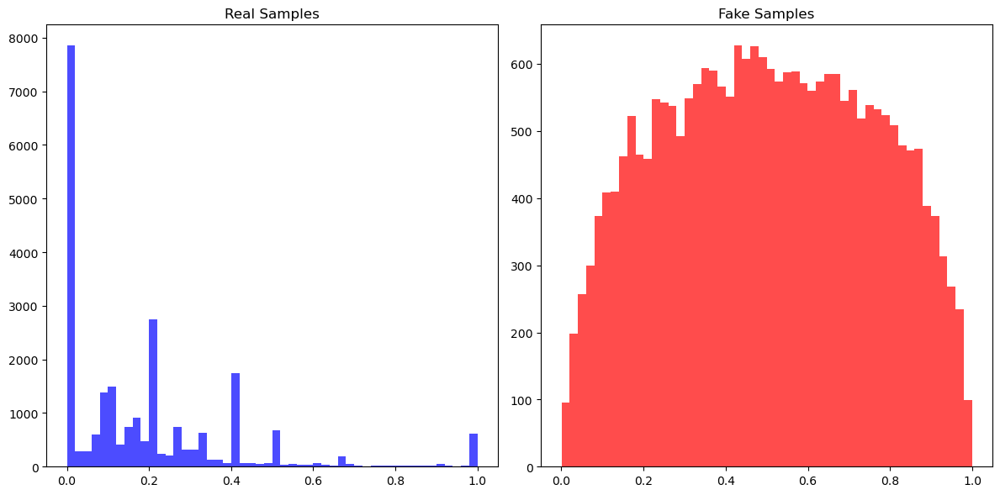

In [101]:
# Get real samples
n_samples = 1000  # Change this based on how many samples you want
real_samples = df_default.sample(n_samples).values.flatten()

# Get fake samples from GAN
fake_samples = default_sample.sample(n_samples).values.flatten()

# Plot
plot_samples(real_samples, fake_samples)


In [102]:
default_sample["IsDefaulter"]=1
df_default["IsDefaulter"]=1
df_paid["IsDefaulter"]=0


In [103]:
daa = pd.concat([default_sample, df_default, df_paid])


In [104]:
daa.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_SEPT,PAY_AUG,PAY_JUL,PAY_JUN,...,BILL_AMT_JUN,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,PAY_AMT_JUL,PAY_AMT_JUN,PAY_AMT_MAY,PAY_AMT_APR,IsDefaulter
count,46728.000000,46728.000000,46728.000000,46728.000000,46728.000000,46728.000000,46728.000000,46728.000000,46728.000000,46728.000000,...,46728.000000,46728.000000,46728.000000,46728.000000,46728.000000,46728.000000,46728.000000,46728.000000,46728.000000,46728.000000
mean,0.497541,0.282361,0.577270,0.360696,0.365475,0.340957,0.306713,0.300171,0.292292,0.282872,...,0.312712,0.259969,0.359194,0.183307,0.185816,0.182485,0.185022,0.187595,0.182204,0.500000
std,0.276477,0.243527,0.416674,0.278907,0.283993,0.228737,0.240831,0.224840,0.235645,0.230315,...,0.226048,0.251567,0.176151,0.275525,0.287206,0.276410,0.276593,0.274769,0.274727,0.500005
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.262434,0.080808,0.000000,0.087037,0.000000,0.155172,0.200000,0.200000,0.136165,0.105599,...,0.165297,0.088084,0.262145,0.001919,0.000908,0.001319,0.001610,0.002345,0.001869,0.000000
50%,0.497204,0.202754,0.667468,0.333333,0.500000,0.293103,0.200000,0.200000,0.200000,0.200000,...,0.199897,0.127513,0.283284,0.006630,0.003266,0.005580,0.007926,0.011644,0.009079,0.500000
75%,0.731628,0.424242,1.000000,0.625807,0.500000,0.482759,0.400000,0.400000,0.400000,0.400000,...,0.376987,0.348550,0.388110,0.356386,0.353454,0.349027,0.356793,0.364133,0.340849,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [105]:
daa

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_SEPT,PAY_AUG,PAY_JUL,PAY_JUN,...,BILL_AMT_JUN,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,PAY_AMT_JUL,PAY_AMT_JUN,PAY_AMT_MAY,PAY_AMT_APR,IsDefaulter
0,0.214408,0.585976,0.386408,0.445963,0.967125,0.162146,0.201721,0.128532,0.569381,0.609518,...,0.722422,0.616109,0.316396,0.268593,0.750904,0.745903,0.913713,0.594027,0.712712,1
1,0.511331,0.082056,0.192953,0.130869,0.339312,0.038057,0.508101,0.215232,0.928759,0.069784,...,0.387206,0.937923,0.421381,0.582757,0.901498,0.061204,0.299770,0.666517,0.494494,1
2,0.502982,0.768638,0.588948,0.295275,0.963673,0.755356,0.962598,0.530063,0.773792,0.109985,...,0.142684,0.919193,0.626706,0.340758,0.226466,0.968420,0.624565,0.635566,0.336191,1
3,0.662224,0.314777,0.657638,0.658623,0.264817,0.193124,0.322805,0.332457,0.585377,0.499539,...,0.756455,0.718434,0.247078,0.302915,0.446184,0.566934,0.416379,0.303439,0.089280,1
4,0.393808,0.518705,0.410781,0.110642,0.780919,0.263506,0.345195,0.397964,0.111074,0.631450,...,0.927018,0.210088,0.083638,0.332547,0.135895,0.714539,0.600896,0.530980,0.290997,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29990,0.999700,0.131313,0.000000,0.333333,0.000000,0.344828,0.200000,0.200000,0.200000,0.200000,...,0.290379,0.129904,0.296422,0.006869,0.004156,0.004719,0.002424,0.004689,0.003783,0
29992,0.999767,0.000000,0.000000,0.666667,0.000000,0.379310,0.200000,0.200000,0.200000,0.000000,...,0.160138,0.080648,0.260979,0.002290,0.000000,0.000000,0.000000,0.000000,0.000000,0
29993,0.999800,0.090909,0.000000,0.000000,0.500000,0.293103,0.200000,0.100000,0.100000,0.200000,...,0.226667,0.149535,0.303248,0.002290,0.066370,0.004464,0.004831,0.004689,0.003783,0
29995,0.999867,0.212121,0.000000,0.666667,0.000000,0.310345,0.200000,0.200000,0.200000,0.200000,...,0.243036,0.111622,0.273259,0.009730,0.011875,0.005583,0.004907,0.011723,0.001892,0


In [106]:
features = df.drop('IsDefaulter', axis=1)

# Separating out the features and the target
daafeatures = daa.drop('IsDefaulter', axis=1)
loan_status = daa['IsDefaulter']

# Reverse the Min-Max scaling
reverse_scaled_features = scaler.inverse_transform(daafeatures)
# Convert reversed scaled features back to DataFrame
reverse_scaled_features_df = pd.DataFrame(reverse_scaled_features, columns=features.columns)



In [107]:
loan_status = daa['IsDefaulter']
# Reset the index for reverse_scaled_features_df
reverse_scaled_features_df.reset_index(drop=True, inplace=True)

# Reset the index for loan_status
loan_status.reset_index(drop=True, inplace=True)

# Joining back the loan_status
reversed_data = pd.concat([reverse_scaled_features_df, loan_status], axis=1)




In [108]:
reversed_data

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_SEPT,PAY_AUG,PAY_JUL,PAY_JUN,...,BILL_AMT_JUN,BILL_AMT_MAY,BILL_AMT_APR,PAY_AMT_SEPT,PAY_AMT_AUG,PAY_AMT_JUL,PAY_AMT_JUN,PAY_AMT_MAY,PAY_AMT_APR,IsDefaulter
0,6433.018300,590116.657615,1.386408,2.337888,2.934249,30.404476,0.017214,-0.714683,3.693812,4.095181,...,596912.958718,540014.780271,72112.360885,234629.651536,1.264717e+06,668358.510418,567416.055679,253369.862056,376786.628353,1
1,15340.413958,91235.787496,1.192953,1.392607,1.678624,23.207313,3.081006,0.152316,7.287589,-1.302165,...,241052.456156,864565.628618,208725.836411,509068.539505,1.518355e+06,54841.076445,186157.446116,284288.964829,261422.034274,1
2,15089.962994,770951.752663,1.588948,1.885825,2.927345,64.810673,7.625977,3.300627,5.737917,-0.900153,...,-18529.092674,845676.465561,475909.152139,297669.698616,3.814266e+05,867743.082504,387854.868293,271087.455896,177732.781953,1
3,19867.062982,321629.630029,1.657638,2.975870,1.529635,32.201177,1.228050,1.324572,3.853771,2.995387,...,633042.105380,643210.377364,-18088.938031,264611.645612,7.514888e+05,507995.425158,258571.565509,129425.669351,47199.230542,1
4,11814.858926,523517.842293,1.410781,1.331927,2.561839,36.283348,1.451953,1.979641,-0.889261,4.314498,...,814108.810304,130540.993502,-230768.050790,290496.922561,2.288828e+05,640255.357676,373156.120420,226478.262871,153840.376789,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46723,29991.000000,140000.000000,1.000000,2.000000,1.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,138262.000000,49675.000000,46121.000000,6000.000000,7.000000e+03,4228.000000,1505.000000,2000.000000,2000.000000,0
46724,29993.000000,10000.000000,1.000000,3.000000,1.000000,43.000000,0.000000,0.000000,0.000000,-2.000000,...,0.000000,0.000000,0.000000,2000.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0
46725,29994.000000,100000.000000,1.000000,1.000000,2.000000,38.000000,0.000000,-1.000000,-1.000000,0.000000,...,70626.000000,69473.000000,55004.000000,2000.000000,1.117840e+05,4000.000000,3000.000000,2000.000000,2000.000000,0
46726,29996.000000,220000.000000,1.000000,3.000000,1.000000,39.000000,0.000000,0.000000,0.000000,0.000000,...,88004.000000,31237.000000,15980.000000,8500.000000,2.000000e+04,5003.000000,3047.000000,5000.000000,1000.000000,0


In [109]:
from sklearn.preprocessing import MinMaxScaler

# Separating out the features and the target
daz = reversed_data.drop('IsDefaulter', axis=1)
loan_status = reversed_data['IsDefaulter']


# Create an instance of MinMaxScaler
scaler = MinMaxScaler()

# Assuming 'data' is your DataFrame
scaled_data1 = scaler.fit_transform(daz)

# Convert scaled_data back to a DataFrame
scaled_data_df1 = pd.DataFrame(scaled_data1, columns=daz.columns)



In [110]:
# Adding loan_status back to the scaled DataFrame using assign
scaled_data_df1 = scaled_data_df1.assign(loan_status=loan_status.values)

# OR

# Using bracket notation
scaled_data_df1['IsDefaulter'] = loan_status.values


In [111]:
scaled_data_df1=scaled_data_df1.drop("loan_status",axis=1)

In [112]:
train, test = train_test_split(scaled_data_df1, test_size=0.2, random_state=42)

print(train.shape)
print(test.shape)

(37382, 25)
(9346, 25)


In [163]:
scaled_data_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46728 entries, 0 to 46727
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ID             46728 non-null  float64
 1   LIMIT_BAL      46728 non-null  float64
 2   SEX            46728 non-null  float64
 3   EDUCATION      46728 non-null  float64
 4   MARRIAGE       46728 non-null  float64
 5   AGE            46728 non-null  float64
 6   PAY_SEPT       46728 non-null  float64
 7   PAY_AUG        46728 non-null  float64
 8   PAY_JUL        46728 non-null  float64
 9   PAY_JUN        46728 non-null  float64
 10  PAY_MAY        46728 non-null  float64
 11  PAY_APR        46728 non-null  float64
 12  BILL_AMT_SEPT  46728 non-null  float64
 13  BILL_AMT_AUG   46728 non-null  float64
 14  BILL_AMT_JUL   46728 non-null  float64
 15  BILL_AMT_JUN   46728 non-null  float64
 16  BILL_AMT_MAY   46728 non-null  float64
 17  BILL_AMT_APR   46728 non-null  float64
 18  PAY_AM

In [164]:
scaled_data_df1=scaled_data_df1.drop('ID', axis=1)

In [165]:
scaled_data_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46728 entries, 0 to 46727
Data columns (total 24 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   LIMIT_BAL      46728 non-null  float64
 1   SEX            46728 non-null  float64
 2   EDUCATION      46728 non-null  float64
 3   MARRIAGE       46728 non-null  float64
 4   AGE            46728 non-null  float64
 5   PAY_SEPT       46728 non-null  float64
 6   PAY_AUG        46728 non-null  float64
 7   PAY_JUL        46728 non-null  float64
 8   PAY_JUN        46728 non-null  float64
 9   PAY_MAY        46728 non-null  float64
 10  PAY_APR        46728 non-null  float64
 11  BILL_AMT_SEPT  46728 non-null  float64
 12  BILL_AMT_AUG   46728 non-null  float64
 13  BILL_AMT_JUL   46728 non-null  float64
 14  BILL_AMT_JUN   46728 non-null  float64
 15  BILL_AMT_MAY   46728 non-null  float64
 16  BILL_AMT_APR   46728 non-null  float64
 17  PAY_AMT_SEPT   46728 non-null  float64
 18  PAY_AM

In [166]:
X_train, y_train = train.drop('IsDefaulter', axis=1), train.IsDefaulter
X_test, y_test = test.drop('IsDefaulter', axis=1), test.IsDefaulter

In [167]:
train, test = train_test_split(reversed_data, test_size=0.2, random_state=42)

print(train.shape)
print(test.shape)

(37382, 25)
(9346, 25)


In [ ]:
scaled_data_df1.info()

In [147]:
X_train, y_train = train.drop('IsDefaulter', axis=1), train.IsDefaulter
X_test, y_test = test.drop('IsDefaulter', axis=1), test.IsDefaulter

In [ ]:
X_train

# CNN1

In [151]:
X_trainn = np.expand_dims(X_train, axis=2)


In [152]:
X_trainn.shape

(37382, 24, 1)

In [153]:
X_trainn.shape[1:]

(24, 1)

In [154]:
X_trainn[0].shape

(24, 1)

In [ ]:
X_trainn

array([[[6.06060606e-02],
        [1.00000000e+00],
        [0.00000000e+00],
        ...,
        [0.00000000e+00],
        [1.17546521e-01],
        [3.40479622e-03]],

       [[2.99570203e-01],
        [9.66791332e-01],
        [1.17790973e-04],
        ...,
        [1.70997955e-04],
        [1.63029658e-03],
        [4.25675062e-05]],

       [[1.65604010e-01],
        [9.75514710e-01],
        [9.92315948e-01],
        ...,
        [5.24511002e-03],
        [1.12837320e-02],
        [9.18695983e-03]],

       ...,

       [[2.02020202e-01],
        [1.00000000e+00],
        [0.00000000e+00],
        ...,
        [0.00000000e+00],
        [0.00000000e+00],
        [0.00000000e+00]],

       [[5.51856346e-02],
        [9.23414469e-01],
        [6.79872930e-03],
        ...,
        [1.65443914e-03],
        [3.10257776e-03],
        [1.58944912e-03]],

       [[4.39427942e-02],
        [9.38675046e-01],
        [1.71957575e-02],
        ...,
        [3.38681741e-03],
        [9.7004

In [155]:
# reshape data for CNN
X_testt = np.expand_dims(X_test, axis=2)

In [156]:
from tensorflow.keras.utils import to_categorical

y_train_encoded = to_categorical(y_train)
y_test_encoded = to_categorical(y_test)


In [174]:
X_trainnn, X_val, y_trainn, y_val = train_test_split(X_trainn, y_train_encoded, test_size=0.5, random_state=42)


In [175]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import MaxPooling1D, BatchNormalization
from tensorflow.keras.layers import AveragePooling1D
from tensorflow.keras.optimizers import Adagrad
# Function to create a new instance of the model
def create_model(input_shape):
    model = Sequential([
        Conv1D(64, 2, activation="relu",padding='same',kernel_regularizer=l2(0.000001) ,  input_shape=input_shape),
        #Dropout(0.5),
        Conv1D(32, 2, activation="relu",padding='same',kernel_regularizer=l2(0.000001) ),
        #Dropout(0.5),
       # BatchNormalization(),
     #   MaxPooling1D(2),
        Flatten(),
        Dense(128, activation="relu"),
        Dropout(0.1),
        Dense(75, activation="relu"),
        Dropout(0.1),
        Dense(50, activation="relu"),
        Dropout(0.1),
        Dense(32, activation="relu"),
        Dropout(0.1),
        Dense(10, activation="relu"),
        Dense(2, activation="softmax")
    ])
    return model

# Create a new model instance
mod = create_model(X_trainn[0].shape)

# Initialize the Adam optimizer with a fixed learning rate
learning_rate = 0.001
optimizer = Adam(learning_rate)

# Compile the model with the optimizer
mod.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10)

# Train the model
history = mod.fit(X_trainnn, y_trainn, epochs=10, batch_size=5,
                  validation_data=(X_val, y_val),
                  callbacks=[early_stopping])

# Now you can use history to plot the training and validation loss and accuracy


Epoch 1/10
3739/3739 ━━━━━━━━━━━━━━━━━━━━ 19s 4ms/step - accuracy: 0.8633 - loss: 0.3294 - val_accuracy: 0.8793 - val_loss: 0.2872
Epoch 2/10
3739/3739 ━━━━━━━━━━━━━━━━━━━━ 16s 4ms/step - accuracy: 0.8758 - loss: 0.2936 - val_accuracy: 0.8822 - val_loss: 0.2874
Epoch 3/10
3739/3739 ━━━━━━━━━━━━━━━━━━━━ 16s 4ms/step - accuracy: 0.8840 - loss: 0.2841 - val_accuracy: 0.8737 - val_loss: 0.2917
Epoch 4/10
3739/3739 ━━━━━━━━━━━━━━━━━━━━ 16s 4ms/step - accuracy: 0.8761 - loss: 0.2925 - val_accuracy: 0.8765 - val_loss: 0.2923
Epoch 5/10
3739/3739 ━━━━━━━━━━━━━━━━━━━━ 16s 4ms/step - accuracy: 0.8799 - loss: 0.2872 - val_accuracy: 0.8831 - val_loss: 0.2824
Epoch 6/10
3739/3739 ━━━━━━━━━━━━━━━━━━━━ 16s 4ms/step - accuracy: 0.8777 - loss: 0.2894 - val_accuracy: 0.8846 - val_loss: 0.2857
Epoch 7/10
3739/3739 ━━━━━━━━━━━━━━━━━━━━ 16s 4ms/step - accuracy: 0.8768 - loss: 0.2866 - val_accuracy: 0.8832 - val_loss: 0.2821
Epoch 8/10
3739/3739 ━━━━━━━━━━━━━━━━━━━━ 17s 5ms/step - accuracy: 0.8864 - loss: 0

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import MaxPooling1D, BatchNormalization
from tensorflow.keras.layers import AveragePooling1D
from tensorflow.keras.optimizers import Adagrad
# Function to create a new instance of the model
def create_model(input_shape):
    model = Sequential([
        Conv1D(64, 2, activation="relu",padding='same',kernel_regularizer=l2(0.000001) ,  input_shape=input_shape),
        #Dropout(0.5),
        Conv1D(32, 2, activation="relu",padding='same',kernel_regularizer=l2(0.000001) ),
        #Dropout(0.5),
       # BatchNormalization(),
     #   MaxPooling1D(2),
        Flatten(),
        Dense(128, activation="relu"),
        Dropout(0.1),
        Dense(75, activation="relu"),
        Dropout(0.1),
        Dense(50, activation="relu"),
        Dropout(0.1),
        Dense(32, activation="relu"),
        Dropout(0.1),
        Dense(10, activation="relu"),
        Dense(2, activation="softmax")
    ])
    return model

# Create a new model instance
mod = create_model(X_trainn[0].shape)

# Initialize the Adam optimizer with a fixed learning rate
learning_rate = 0.01
optimizer = Adam(learning_rate)

# Compile the model with the optimizer
mod.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10)

# Train the model
history = mod.fit(X_trainnn, y_trainn, epochs=5, batch_size=20,
                  validation_data=(X_val, y_val),
                  callbacks=[early_stopping])

# Now you can use history to plot the training and validation loss and accuracy


In [176]:
loss, accuracy = mod.evaluate(X_testt, y_test_encoded)


293/293 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8737 - loss: 0.3027


In [193]:
import numpy as np
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.regularizers import l2
import random


# Function to create the CNN model
def create_cnn_model(num_conv_layers=2, num_filters=64, kernel_size=3, 
                     stride=1, pooling_size=2, num_dense_layers=1, 
                     dense_units=128, dropout_rate=0.5, learning_rate=0.001, 
                     optimizer='adam', activation='relu', l2_regularization=0.0001):
    model = Sequential()
    
    # Add Convolutional and Pooling layers
    for i in range(num_conv_layers):
        if i == 0:
            model.add(Conv1D(filters=num_filters, kernel_size=kernel_size, strides=stride, 
                             activation=activation, padding='same', 
                             input_shape=(24, 1), kernel_regularizer=l2(l2_regularization)))
        else:
            model.add(Conv1D(filters=num_filters, kernel_size=kernel_size, strides=stride, 
                             activation=activation, padding='same', kernel_regularizer=l2(l2_regularization)))
        model.add(MaxPooling1D(pool_size=pooling_size))
    
    model.add(Flatten())
    
    # Add multiple Dense layers
    for _ in range(num_dense_layers):
        model.add(Dense(dense_units, activation=activation))
        model.add(Dropout(dropout_rate))
    
    # Output layer
    model.add(Dense(y_train_encoded.shape[1], activation='softmax'))
    
    # Compile the model
    if optimizer == 'adam':
        optimizer_instance = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        optimizer_instance = RMSprop(learning_rate=learning_rate)
    elif optimizer == 'sgd':
        optimizer_instance = SGD(learning_rate=learning_rate)
    
    model.compile(optimizer=optimizer_instance, loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

# Define the hyperparameter space with lists of discrete values
param_dist = {
    'num_conv_layers': [1, 2, 3, 4],             # Number of Conv layers
    'num_filters': [32, 64, 96, 128],                # Number of filters
    'kernel_size': [2, 3, 4],                    # Kernel size options
    'stride': [1],                            # Stride options
    'pooling_size': [2],                      # Pooling size options
    'num_dense_layers': [1, 2, 3,4,5],               # Number of Dense layers
    'dense_units': [64, 128, 180, 256],               # Dense units options
    'dropout_rate': [0.2, 0.3, 0.4, 0.5],        # Dropout rate options
    'learning_rate': [0.0001, 0.001, 0.005, 0.01, 0.1],       # Learning rate options
    'batch_size': [16, 32, 64, 128],             # Batch size options
    'optimizer': ['adam', 'rmsprop', 'sgd'],     # Optimizer options
    'activation': ['relu', 'leaky_relu', 'elu'], # Activation function options
    'l2_regularization': [0.0001, 0.001, 0.005, 0.01, 0.1] # L2 regularization options
}

# Function to randomly sample hyperparameters
def sample_hyperparameters(param_dist):
    sampled_params = {}
    for param, values in param_dist.items():
        sampled_params[param] = random.choice(values)  # Sample a value from the list
    return sampled_params

# List to store the results
results = []

# Perform random search for a fixed number of iterations (e.g., 10)
for iteration in range(10):
    print(f"Iteration {iteration + 1}")
    
    # Sample random hyperparameters
    params = sample_hyperparameters(param_dist)
    
    # Create the CNN model with sampled hyperparameters
    model = create_cnn_model(
        num_conv_layers=params['num_conv_layers'],
        num_filters=params['num_filters'],
        kernel_size=params['kernel_size'],
        stride=params['stride'],
        pooling_size=params['pooling_size'],
        num_dense_layers=params['num_dense_layers'],  # Vary the number of Dense layers
        dense_units=params['dense_units'],
        dropout_rate=params['dropout_rate'],
        learning_rate=params['learning_rate'],
        optimizer=params['optimizer'],
        activation=params['activation'],
        l2_regularization=params['l2_regularization']
    )
    
    # Train the model
    history = model.fit(X_trainn, y_train_encoded, 
                        validation_data=(X_testt, y_test_encoded),
                        epochs=10, batch_size=int(params['batch_size']), verbose=1)
    
    # Evaluate the model on the test data
    test_loss, test_accuracy = model.evaluate(X_testt, y_test_encoded, verbose=0)
    
    print(f"Test Accuracy: {test_accuracy}")
    
    # Store the result
    results.append({
        'params': params,
        'accuracy': test_accuracy
    })

# Step 5: Sort results by accuracy in descending order
sorted_results = sorted(results, key=lambda x: x['accuracy'], reverse=True)

# Output the top 3 models
print("Top 3 Best Models:")

for i in range(3):
    print(f"Rank {i + 1}")
    print(f"Accuracy: {sorted_results[i]['accuracy']}")
    print(f"Hyperparameters: {sorted_results[i]['params']}")
    print("-" * 30)

Iteration 1
Epoch 1/10
1169/1169 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.5366 - loss: 1.9812 - val_accuracy: 0.8289 - val_loss: 1.9454
Epoch 2/10
1169/1169 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.6701 - loss: 1.9407 - val_accuracy: 0.8549 - val_loss: 1.9061
Epoch 3/10
1169/1169 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7753 - loss: 1.9025 - val_accuracy: 0.8541 - val_loss: 1.8645
Epoch 4/10
1169/1169 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8274 - loss: 1.8620 - val_accuracy: 0.8539 - val_loss: 1.8202
Epoch 5/10
1169/1169 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8520 - loss: 1.8168 - val_accuracy: 0.8537 - val_loss: 1.7747
Epoch 6/10
1169/1169 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8571 - loss: 1.7743 - val_accuracy: 0.8538 - val_loss: 1.7306
Epoch 7/10
1169/1169 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8594 - loss: 1.7311 - val_accuracy: 0.8537 - val_loss: 1.6916
Epoch 8/10
1169/1169 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8591 - los

In [196]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np

# Define parameters for the top 3 models
top_3_models = [
    {'num_conv_layers': 2, 'num_filters': 128, 'kernel_size': 4, 'stride': 1, 'pooling_size': 2,
     'num_dense_layers': 4, 'dense_units': 128, 'dropout_rate': 0.3, 'learning_rate': 0.1,
     'batch_size': 64, 'optimizer': 'sgd', 'activation': 'leaky_relu', 'l2_regularization': 0.0001},

    {'num_conv_layers': 3, 'num_filters': 64, 'kernel_size': 4, 'stride': 1, 'pooling_size': 2,
     'num_dense_layers': 2, 'dense_units': 64, 'dropout_rate': 0.5, 'learning_rate': 0.001,
     'batch_size': 128, 'optimizer': 'adam', 'activation': 'elu', 'l2_regularization': 0.0001},

    {'num_conv_layers': 3, 'num_filters': 96, 'kernel_size': 3, 'stride': 1, 'pooling_size': 2,
     'num_dense_layers': 4, 'dense_units': 128, 'dropout_rate': 0.2, 'learning_rate': 0.005,
     'batch_size': 32, 'optimizer': 'sgd', 'activation': 'relu', 'l2_regularization': 0.0001}
]

# Function to perform cross-validation and calculate metrics
def cross_validate_and_evaluate(params, X, y, folds=10):
    kfold = KFold(n_splits=folds, shuffle=True)
    
    accuracy_list = []
    precision_list = []
    recall_list = []
    f1_list = []
    
    for train_idx, val_idx in kfold.split(X):
        X_train_fold, X_val_fold = X[train_idx], X[val_idx]
        y_train_fold, y_val_fold = y[train_idx], y[val_idx]

        # Create CNN model using sampled parameters
        model = create_cnn_model(
            num_conv_layers=params['num_conv_layers'],
            num_filters=params['num_filters'],
            kernel_size=params['kernel_size'],
            stride=params['stride'],
            pooling_size=params['pooling_size'],
            num_dense_layers=params['num_dense_layers'],
            dense_units=params['dense_units'],
            dropout_rate=params['dropout_rate'],
            learning_rate=params['learning_rate'],
            optimizer=params['optimizer'],
            activation=params['activation'],
            l2_regularization=params['l2_regularization']
        )
        
        # Train the model
        model.fit(X_train_fold, y_train_fold, 
                  epochs=10, batch_size=int(params['batch_size']), verbose=0)
        
        # Predict on validation fold
        y_val_pred = np.argmax(model.predict(X_val_fold), axis=1)
        y_val_true = np.argmax(y_val_fold, axis=1)
        
        # Calculate metrics
        accuracy_list.append(accuracy_score(y_val_true, y_val_pred))
        precision_list.append(precision_score(y_val_true, y_val_pred, average='macro'))
        recall_list.append(recall_score(y_val_true, y_val_pred, average='macro'))
        f1_list.append(f1_score(y_val_true, y_val_pred, average='macro'))
    
    # Return the average of each metric across all folds
    return {
        'accuracy': np.mean(accuracy_list),
        'precision': np.mean(precision_list),
        'recall': np.mean(recall_list),
        'f1_score': np.mean(f1_list)
    }

# Perform cross-validation and evaluate metrics for each of the top 3 models
for i, params in enumerate(top_3_models):
    print(f"Evaluating Model {i+1}...")
    metrics = cross_validate_and_evaluate(params, X_trainn, y_train_encoded, folds=10)
    
    print(f"Model {i+1} Results:")
    print(f"Accuracy: {metrics['accuracy']}")
    print(f"Precision: {metrics['precision']}")
    print(f"Recall: {metrics['recall']}")
    print(f"F1-Score: {metrics['f1_score']}")
    print("-" * 30)


Evaluating Model 1...
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Model 1 Results:
Accuracy: 0.8779094689884692
Precision: 0.8840920940025943
Recall: 0.8779122610289548
F1-Score: 0.8773916194488207
------------------------------
Evaluating Model 2...
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
117/117 ━━━━━━

# CNN2

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import MaxPooling1D, BatchNormalization
from tensorflow.keras.layers import AveragePooling1D
from tensorflow.keras.optimizers import SGD

# Define the model

mod2 = Sequential([
    Conv1D(75, 2, activation="relu", padding='same', input_shape=X_trainn[0].shape),
    BatchNormalization(),
    MaxPooling1D(2),
    Conv1D(60, 2, activation="relu", padding='same', ),
    BatchNormalization(),
    MaxPooling1D(2),
    Conv1D(30, 2, activation="relu", padding='same',),
    BatchNormalization(),
    MaxPooling1D(2),
    #Conv1D(15, 2, activation="relu", padding='same',),
    #BatchNormalization(),
    #MaxPooling1D(2),
    Flatten(),
    Dense(128, activation="relu"),
     #Dropout(0.1),
    Dense(75, activation="relu"),
      #  Dropout(0.1),
    Dense(50, activation="relu"),
       # Dropout(0.1),
    Dense(32, activation="relu"),
        #Dropout(0.1),
    Dense(10, activation="relu"),
    Dense(2, activation="softmax")

])

optimizer = Adam()

mod2.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])


# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=3)



In [ ]:

# Now, X_train and y_train are your training data
# and X_val and y_val are your validation data

# Train the model with validation data
history2 = mod2.fit(
    X_trainnn, y_trainn,
    epochs=10,batch_size=90,
    validation_data=(X_val, y_val),  # Add validation data here
    callbacks=[early_stopping]
)


Epoch 1/10
208/208 [==============================] - 5s 17ms/step - loss: 0.3092 - accuracy: 0.8631 - val_loss: 0.8543 - val_accuracy: 0.5039
Epoch 2/10
208/208 [==============================] - 3s 16ms/step - loss: 0.2882 - accuracy: 0.8753 - val_loss: 0.6645 - val_accuracy: 0.6512
Epoch 3/10
208/208 [==============================] - 3s 16ms/step - loss: 0.2865 - accuracy: 0.8788 - val_loss: 0.2865 - val_accuracy: 0.8743
Epoch 4/10
208/208 [==============================] - 3s 15ms/step - loss: 0.2834 - accuracy: 0.8790 - val_loss: 0.2828 - val_accuracy: 0.8780
Epoch 5/10
208/208 [==============================] - 3s 16ms/step - loss: 0.2810 - accuracy: 0.8803 - val_loss: 0.2840 - val_accuracy: 0.8766
Epoch 6/10
208/208 [==============================] - 3s 15ms/step - loss: 0.2804 - accuracy: 0.8817 - val_loss: 0.2843 - val_accuracy: 0.8765
Epoch 7/10
208/208 [==============================] - 3s 15ms/step - loss: 0.2805 - accuracy: 0.8819 - val_loss: 0.2814 - val_accuracy: 0.8817

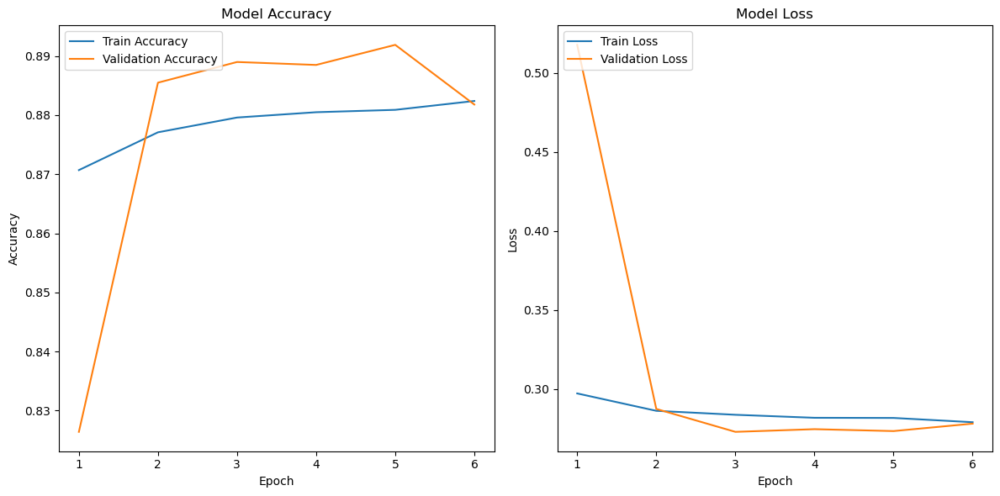

In [ ]:
import matplotlib.pyplot as plt

# Data from user
training_loss = [0.2973, 0.2863, 0.2838, 0.2819, 0.2818, 0.2791]
validation_loss = [0.5177, 0.2875, 0.2730, 0.2747, 0.2735, 0.2782]
training_accuracy = [0.8707, 0.8771, 0.8796, 0.8805, 0.8809, 0.8824]
validation_accuracy = [0.8264, 0.8855, 0.8890, 0.8885, 0.8919, 0.8818]

# Creating count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(epoch_count, training_accuracy, label='Train Accuracy')
plt.plot(epoch_count, validation_accuracy, label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(epoch_count, training_loss, label='Train Loss')
plt.plot(epoch_count, validation_loss, label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()


In [ ]:
loss, accuracy = mod2.evaluate(X_testt, y_test_encoded)


293/293 [==============================] - 1s 2ms/step - loss: 0.2925 - accuracy: 0.8753


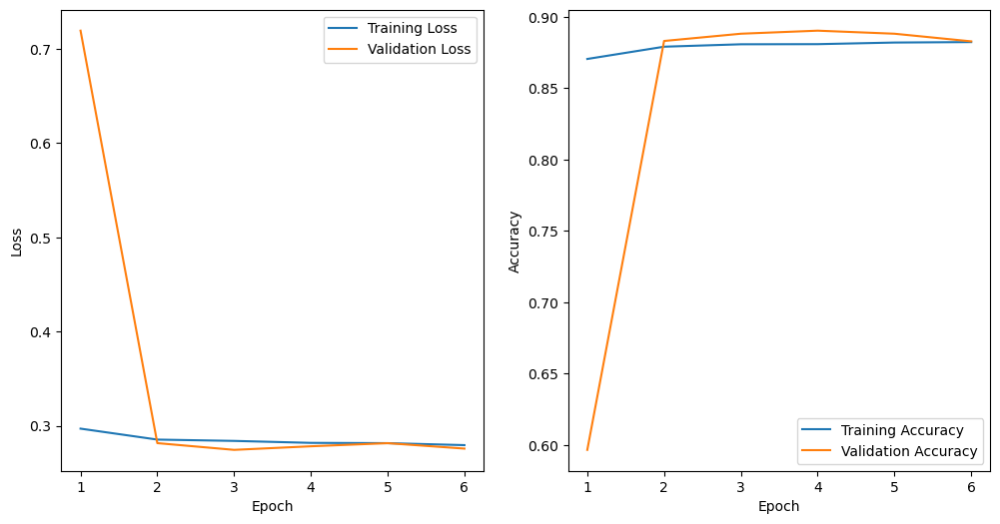

In [ ]:
import matplotlib.pyplot as plt

# Extracting the history
training_loss = history2.history['loss']
validation_loss = history2.history['val_loss']
training_accuracy = history2.history['accuracy']
validation_accuracy = history2.history['val_accuracy']

# Creating count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)

# Visualizing the loss
plt.figure(figsize=(12, 6))

# Plotting training and validation loss
plt.subplot(1, 2, 1)
plt.plot(epoch_count, training_loss)
plt.plot(epoch_count, validation_loss)
plt.legend(['Training Loss', 'Validation Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')

# Plotting training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(epoch_count, training_accuracy)
plt.plot(epoch_count, validation_accuracy)
plt.legend(['Training Accuracy', 'Validation Accuracy'])
plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.show()


In [ ]:
cnn2pred = mod2.predict(X_testt)
cnn2pred=np.argmax(cnn2pred, axis=1)


293/293 [==============================] - 1s 2ms/step


In [ ]:
from sklearn.metrics import precision_score, recall_score,f1_score


precision = precision_score(y_test, cnn2pred,average='macro')

# Calculate Recall
recall = recall_score(y_test, cnn2pred,average='macro')
f1 = f1_score(y_test, cnn2pred,average='macro')

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")


Precision: 0.8873367553600111
Recall: 0.8759148240735529
F1 Score: 0.8744891466343467


# CNN 3

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import MaxPooling1D, BatchNormalization
from tensorflow.keras.layers import AveragePooling1D
from tensorflow.keras.optimizers import Adagrad

# Define the model

mod3 = Sequential([
    Conv1D(64, 2, activation="relu",kernel_regularizer=l2(0.000001),  input_shape=X_trainn[0].shape),
    #Conv1D(64, 2, activation="tanh",kernel_regularizer=l2(0.000001)),
    #Conv1D(64, 2, activation="tanh",kernel_regularizer=l2(0.000001)),
    #Conv1D(32, 2, activation="tanh",kernel_regularizer=l2(0.000001)),

    Flatten(),
    Dense(64, activation="relu"),
    Dropout(0.5),
    Dense(32, activation="relu"),
    Dropout(0.5),
    Dense(15, activation="tanh"),
    Dropout(0.5),
    Dense(2, activation="softmax")
])

optimizer = Adam(learning_rate=0.01)
mod3.compile(optimizer=optimizer, loss="binary_crossentropy", metrics=["accuracy"])


# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=3)



In [ ]:

# Now, X_train and y_train are your training data
# and X_val and y_val are your validation data

# Train the model with validation data
history3 = mod3.fit(
    X_trainnn, y_trainn,
    epochs=10,batch_size=28,
    validation_data=(X_val, y_val),  # Add validation data here
    callbacks=[early_stopping]
)


Epoch 1/10
668/668 [==============================] - 4s 6ms/step - loss: 0.3476 - accuracy: 0.8603 - val_loss: 0.3215 - val_accuracy: 0.8716
Epoch 2/10
668/668 [==============================] - 4s 6ms/step - loss: 0.3301 - accuracy: 0.8662 - val_loss: 0.3008 - val_accuracy: 0.8758
Epoch 3/10
668/668 [==============================] - 4s 6ms/step - loss: 0.3273 - accuracy: 0.8690 - val_loss: 0.2930 - val_accuracy: 0.8767
Epoch 4/10
668/668 [==============================] - 4s 6ms/step - loss: 0.3233 - accuracy: 0.8699 - val_loss: 0.2940 - val_accuracy: 0.8792
Epoch 5/10
668/668 [==============================] - 4s 6ms/step - loss: 0.3282 - accuracy: 0.8676 - val_loss: 0.2996 - val_accuracy: 0.8759
Epoch 6/10
668/668 [==============================] - 4s 6ms/step - loss: 0.3223 - accuracy: 0.8713 - val_loss: 0.2899 - val_accuracy: 0.8822
Epoch 7/10
668/668 [==============================] - 4s 6ms/step - loss: 0.3218 - accuracy: 0.8690 - val_loss: 0.2971 - val_accuracy: 0.8772
Epoch 

In [ ]:
loss, accuracy = mod3.evaluate(X_testt, y_test_encoded)


293/293 [==============================] - 1s 2ms/step - loss: 0.2994 - accuracy: 0.8768


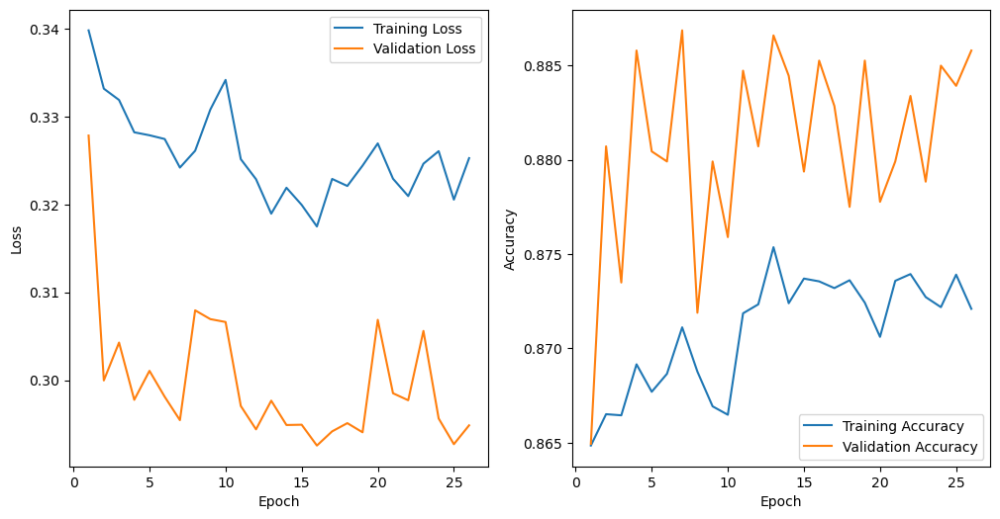

In [ ]:
import matplotlib.pyplot as plt

# Extracting the history
training_loss = history4.history['loss']
validation_loss = history4.history['val_loss']
training_accuracy = history4.history['accuracy']
validation_accuracy = history4.history['val_accuracy']

# Creating count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)

# Visualizing the loss
plt.figure(figsize=(12, 6))

# Plotting training and validation loss
plt.subplot(1, 2, 1)
plt.plot(epoch_count, training_loss)
plt.plot(epoch_count, validation_loss)
plt.legend(['Training Loss', 'Validation Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')

# Plotting training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(epoch_count, training_accuracy)
plt.plot(epoch_count, validation_accuracy)
plt.legend(['Training Accuracy', 'Validation Accuracy'])
plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.show()


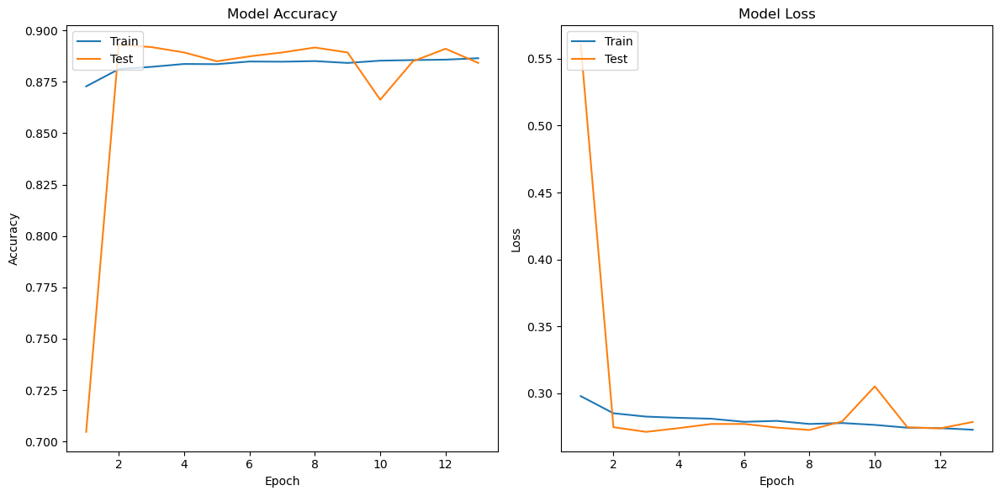

In [ ]:
import matplotlib.pyplot as plt

# Training and validation accuracy and loss data
training_accuracy = [0.8728, 0.8812, 0.8823, 0.8837, 0.8836, 0.8849, 0.8848, 0.8851, 0.8842, 0.8853, 0.8856, 0.8858, 0.8865]
validation_accuracy = [0.7047, 0.8930, 0.8919, 0.8893, 0.8850, 0.8874, 0.8893, 0.8917, 0.8893, 0.8663, 0.8850, 0.8911, 0.8842]
training_loss = [0.2979, 0.2851, 0.2826, 0.2817, 0.2810, 0.2787, 0.2794, 0.2771, 0.2778, 0.2764, 0.2743, 0.2740, 0.2728]
validation_loss = [0.5604, 0.2747, 0.2712, 0.2740, 0.2771, 0.2771, 0.2744, 0.2726, 0.2790, 0.3052, 0.2746, 0.2738, 0.2786]

# Creating count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(epoch_count, training_accuracy, label='Train')
plt.plot(epoch_count, validation_accuracy, label='Test')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(epoch_count, training_loss, label='Train')
plt.plot(epoch_count, validation_loss, label='Test')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()


In [ ]:
cnn3pred = mod3.predict(X_testt)
cnn3pred=np.argmax(cnn3pred, axis=1)


293/293 [==============================] - 0s 1ms/step


In [ ]:
from sklearn.metrics import precision_score, recall_score,f1_score
precision = precision_score(y_test, cnn3pred,average='macro')

# Calculate Recall
recall = recall_score(y_test, cnn3pred,average='macro')
f1 = f1_score(y_test, cnn3pred,average='macro')

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")


Precision: 0.8897072894631073
Recall: 0.874814051584196
F1 Score: 0.8730348752504729


# Stacked

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Concatenate, Dense
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier

# Assuming mod, mod2, mod3 are your trained CNN models
# Generate predictions from each model on the training data
CNN1_output_train = mod.predict(X_trainn)
CNN2_output_train = mod2.predict(X_trainn)
CNN3_output_train = mod3.predict(X_trainn)

# Concatenate the outputs of the three models
ensemble_features_train = np.column_stack([CNN1_output_train, CNN2_output_train, CNN3_output_train])

# Train a Random Forest classifier as the meta-learner
meta_learner = RandomForestClassifier(n_estimators=1500,max_depth=10,max_features='sqrt',bootstrap=True,min_samples_split=4,min_samples_leaf=2,random_state=42)
meta_learner.fit(ensemble_features_train, y_train)


1169/1169 [==============================] - 2s 2ms/step


RandomForestClassifier(max_depth=10, n_estimators=1500)

In [ ]:

# Generate predictions from each model on the test data
CNN1_output_test = mod.predict(X_testt)
CNN2_output_test = mod2.predict(X_testt)
CNN3_output_test = mod3.predict(X_testt)

# Concatenate the outputs of the three models for the test set
ensemble_features_test = np.column_stack([CNN1_output_test, CNN2_output_test, CNN3_output_test])

# Predict on the test set using the meta-learner
predictions_test = meta_learner.predict(ensemble_features_test)

# Calculate accuracy on the test set
accuracy_test = accuracy_score(y_test, predictions_test)
print("Test Accuracy:", accuracy_test)


293/293 [==============================] - 1s 2ms/step
Test Accuracy: 0.8813396105285684


In [ ]:
from sklearn.metrics import precision_score, recall_score,f1_score



precision = precision_score(y_test, predictions_test,average='macro')

recall = recall_score(y_test, predictions_test,average='macro')

f1 = f1_score(y_test, predictions_test,average='macro')

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")


Precision: 0.8868166132678936
Recall: 0.8817242136837242
F1 Score: 0.8809893831677739


## DT

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Concatenate, Dense
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier

# Assuming mod, mod2, mod3 are your trained CNN models
# Generate predictions from each model on the training data
CNN1_output_train = mod.predict(X_trainn)
CNN2_output_train = mod2.predict(X_trainn)
CNN3_output_train = mod3.predict(X_trainn)

# Concatenate the outputs of the three models
ensemble_features_train = np.column_stack([CNN1_output_train, CNN2_output_train, CNN3_output_train])

# Train a decision tree classifier as the meta-learner
meta_learner1 = DecisionTreeClassifier(max_depth=8, min_samples_split=4,min_samples_leaf=2,class_weight='balanced',max_features='sqrt',random_state=42)
meta_learner1.fit(ensemble_features_train, y_train)

1169/1169 [==============================] - 2s 2ms/step


DecisionTreeClassifier(class_weight='balanced', max_depth=8,
                       max_features='sqrt', min_samples_leaf=2,
                       min_samples_split=4, random_state=42)

In [ ]:

# Generate predictions from each model on the test data
CNN1_output_test = mod.predict(X_testt)
CNN2_output_test = mod2.predict(X_testt)
CNN3_output_test = mod3.predict(X_testt)

# Concatenate the outputs of the three models for the test set
ensemble_features_test = np.column_stack([CNN1_output_test, CNN2_output_test, CNN3_output_test])

# Predict on the test set using the meta-learner
predictions_test1 = meta_learner1.predict(ensemble_features_test)

# Calculate accuracy on the test set
accuracy_test = accuracy_score(y_test, predictions_test1)
print("Test Accuracy:", accuracy_test)


293/293 [==============================] - 1s 2ms/step
Test Accuracy: 0.8775946929167558


In [ ]:
predictions_test1

array([1, 0, 0, ..., 1, 1, 1], dtype=int64)

In [ ]:
from sklearn.metrics import precision_score, recall_score,f1_score



precision = precision_score(y_test, predictions_test1,average='macro')

recall = recall_score(y_test, predictions_test1,average='macro')

f1 = f1_score(y_test, predictions_test1,average='macro')

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")


Precision: 0.8822417560572821
Recall: 0.8779509772587315
F1 Score: 0.8772896214600251


## XGB

In [ ]:
import xgboost as xgb
from xgboost import XGBClassifier

from sklearn.tree import DecisionTreeClassifier
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Concatenate, Dense
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier

# Assuming mod, mod2, mod3 are your trained CNN models
# Generate predictions from each model on the training data
CNN1_output_train = mod.predict(X_trainn)
CNN2_output_train = mod2.predict(X_trainn)
CNN3_output_train = mod3.predict(X_trainn)

# Concatenate the outputs of the three models
ensemble_features_train = np.column_stack([CNN1_output_train, CNN2_output_train, CNN3_output_train])

# Train a decision tree classifier as the meta-learner
meta_learner2 = XGBClassifier(n_estimators=200, max_depth=15,random_state=42)
meta_learner2.fit(ensemble_features_train, y_train)

1169/1169 [==============================] - 2s 1ms/step


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=15, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [ ]:

# Generate predictions from each model on the test data
CNN1_output_test = mod.predict(X_testt)
CNN2_output_test = mod2.predict(X_testt)
CNN3_output_test = mod3.predict(X_testt)

# Concatenate the outputs of the three models for the test set
ensemble_features_test = np.column_stack([CNN1_output_test, CNN2_output_test, CNN3_output_test])

# Predict on the test set using the meta-learner
predictions_test2 = meta_learner2.predict(ensemble_features_test)

# Calculate accuracy on the test set
accuracy_test = accuracy_score(y_test, predictions_test2)
print("Test Accuracy:", accuracy_test)


293/293 [==============================] - 1s 2ms/step
Test Accuracy: 0.86347100363792


In [ ]:
from sklearn.metrics import precision_score, recall_score,f1_score



precision = precision_score(y_test, predictions_test2,average='macro')

recall = recall_score(y_test, predictions_test2,average='macro')

f1 = f1_score(y_test, predictions_test2,average='macro')

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")


Precision: 0.8730084216366467
Recall: 0.8685457873315702
F1 Score: 0.8678273524843921


In [93]:
col=df.drop(columns=["IsDefaulter"])

# Lime

In [ ]:
import lime
import lime.lime_tabular


# Explain a prediction using LIME
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_test.values,
    feature_names=col.columns,
    class_names=['Charged Off', 'Fully Paid'],  # Replace with your class names
    mode='classification'
)

# Index of the instance to explain
i = 1
exp = explainer.explain_instance(
    data_row=X_test.iloc[i],
    predict_fn=lgbm.predict_proba
)

# Display the explanation
exp.show_in_notebook(show_table=True, show_all=False)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


<Figure size 800x600 with 0 Axes>

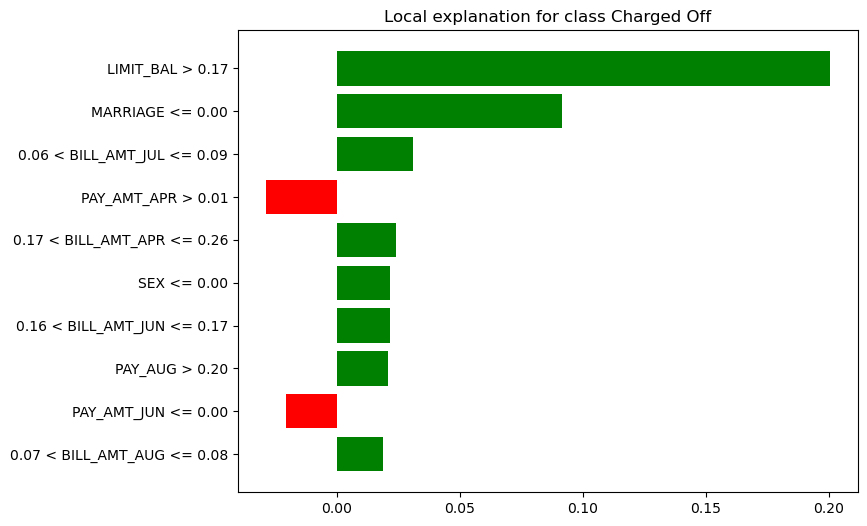

In [ ]:
import matplotlib.pyplot as plt
from lime import lime_tabular

# Assuming lgbm is your model, and X_test and col.columns are set correctly
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_test.values,
    feature_names=col.columns,
    class_names=['Charged Off', 'Fully Paid'],
    mode='classification'
)

# Index of the instance to explain
i = 1
# Explain the prediction specifically for the class 'Charged Off'
exp = explainer.explain_instance(
    data_row=X_test.iloc[i],
    predict_fn=lgbm.predict_proba,
    labels=[0]  # Adjust this index based on the order of class_names
)

# Set the figure size globally
plt.figure(figsize=(8, 6))

# Ensure to explicitly set the label when plotting
if exp.available_labels():  # Check if labels are available in the explanation
    label_to_explain = exp.available_labels()[0]  # Assumes 'Charged Off' is first if labels=[0] is used
    exp_fig = exp.as_pyplot_figure(label=label_to_explain)
    exp_fig.set_size_inches(8, 6)  # Adjust the size as needed
    plt.rcParams.update({'font.size': 12})  # Adjust font size for readability
    plt.show()
else:
    print("No explanations available for the specified label.")


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


<Figure size 800x600 with 0 Axes>

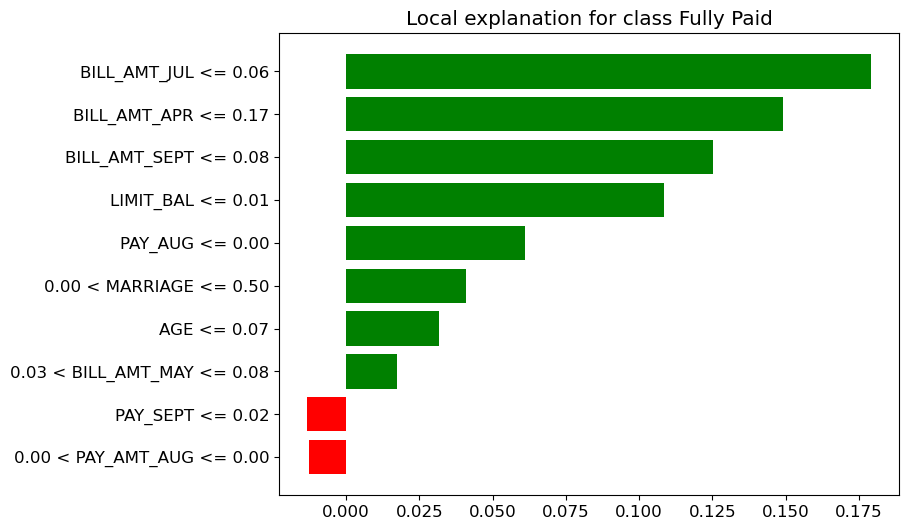

In [ ]:
import matplotlib.pyplot as plt
from lime import lime_tabular

# Assuming lgbm is your model, and X_test and col.columns are set correctly
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_test.values,
    feature_names=col.columns,
    class_names=['Charged Off', 'Fully Paid'],
    mode='classification'
)

# Index of the instance to explain
i = 8
# Explain the prediction specifically for the class 'Charged Off'
exp = explainer.explain_instance(
    data_row=X_test.iloc[i],
    predict_fn=lgbm.predict_proba,
    labels=[1]  # Adjust this index based on the order of class_names
)
# Set the figure size globally (this affects all plots)
plt.figure(figsize=(8, 6))

# Plot the explanation
exp_fig = exp.as_pyplot_figure()
exp_fig.set_size_inches(8, 6)  # Adjust the size as needed

# Adjust font sizes for better readability
plt.rcParams.update({'font.size': 12})  # Adjust font size here

plt.show()

In [ ]:

# Exlain a prediction
i = 8 # Index of the instance to explain
exp = explainer.explain_instance(
    data_row=X_test.iloc[i],
    predict_fn=lgbm.predict_proba, num_features=10
)

# Display the explanation
exp.show_in_notebook(show_table=True, show_all=False)


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


<Figure size 800x600 with 0 Axes>

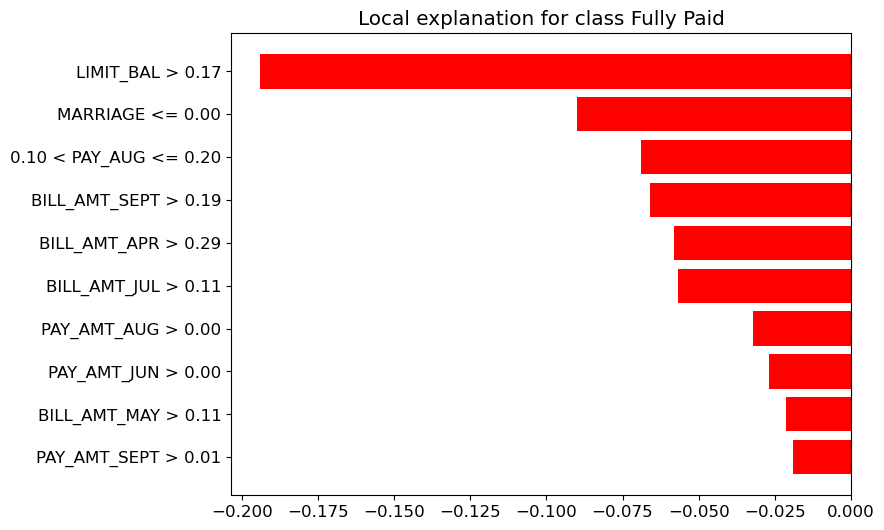

In [ ]:
import matplotlib.pyplot as plt
from lime import lime_tabular

# Assuming you have already created a model and prepared your dataset
explainer = lime_tabular.LimeTabularExplainer(training_data=X_train.values,
                                              feature_names=X_train.columns,
                                              class_names=['Charged Off', 'Fully Paid'],
                                              mode='classification')

# Explain a prediction
exp = explainer.explain_instance(data_row=X_test.iloc[209], predict_fn=lgbm.predict_proba)
plt.figure(figsize=(8, 6))

# Plot the explanation
exp_fig = exp.as_pyplot_figure()
exp_fig.set_size_inches(8, 6)  # Resize the figure that has been created by LIME

# Adjust font sizes if necessary
plt.rcParams.update({'font.size': 12})  # Adjust font size here

plt.show()


In [ ]:


# Explain a prediction
i = 1  # Index of the instance to explain
exp = explainer.explain_instance(
    data_row=X_test.iloc[i],
    predict_fn=lgbm.predict_proba
)

# Display the explanation
exp.show_in_notebook(show_table=True, show_all=False)


In [ ]:
!pip install eli5

In [ ]:
pip uninstall scikit-learn


^C
Note: you may need to restart the kernel to use updated packages.


In [87]:
!pip install eli5


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107720 sha256=c9cb9867f691e521b38ac04c73ea5c0261b413746d98079b034dd40414385800
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [94]:
import eli5
from eli5.sklearn import PermutationImportance

perm_importance = PermutationImportance(lgbm, random_state=42).fit(X_test, y_test)
feature_names = col.columns.tolist()  # Ensure feature names are in a list format

# Display the feature importance
eli5.show_weights(perm_importance, feature_names=feature_names)


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

Weight,Feature
0.1178 ± 0.0060,PAY_JUN
0.0635 ± 0.0027,BILL_AMT_JUL
0.0445 ± 0.0019,PAY_SEPT
0.0135 ± 0.0012,BILL_AMT_JUN
0.0110 ± 0.0022,BILL_AMT_APR
0.0063 ± 0.0020,BILL_AMT_SEPT
0.0051 ± 0.0029,BILL_AMT_MAY
0.0035 ± 0.0027,PAY_AMT_MAY
0.0031 ± 0.0018,PAY_AMT_AUG
0.0018 ± 0.0014,AGE


# shap value

In [ ]:
import shap
background = X_testt[np.random.choice(X_testt.shape[0], 5000, replace=False)]

exs = shap.DeepExplainer(modd, background)


In [ ]:
shapval = exs.shap_values(background)

In [ ]:
print(np.array(shapval).shape)



(2, 5000, 23, 1)


In [ ]:
shapv = np.array(shapval)  # ensure shapv is a numpy array
shapv_reshaped = np.squeeze(shapval, axis=-1)


In [ ]:
col=scaled_data_df1.drop(columns=["IsDefaulter"])

In [ ]:
pred = modd.predict(background)
pred[0:10]

157/157 [==============================] - 0s 933us/step


array([[9.6291089e-01, 3.7089132e-02],
       [9.7317886e-01, 2.6821148e-02],
       [9.7148955e-01, 2.8510455e-02],
       [5.7422130e-15, 1.0000000e+00],
       [2.5626856e-14, 1.0000000e+00],
       [9.4722342e-01, 5.2776575e-02],
       [1.4791016e-09, 1.0000000e+00],
       [9.4516712e-01, 5.4832876e-02],
       [9.8337495e-01, 1.6625127e-02],
       [7.0975059e-15, 1.0000000e+00]], dtype=float32)

In [ ]:
pred=np.argmax(pred, axis=1)


In [ ]:
pred[20:30]37

array([0, 0, 0, 1, 1, 0, 0, 0, 1, 1], dtype=int64)

In [ ]:
#class 1 ( default )
shap.initjs()
shap.force_plot(exs.expected_value[1].numpy(), shapv_reshaped[1][51], background[52],feature_names=col.columns)

In [ ]:
#class 0 (no default )
shap.initjs()
shap.force_plot(exs.expected_value[0].numpy(), shapv_reshaped[0][12], background[12],feature_names=col.columns)

In [ ]:
#class 0 (no default)
shap.initjs()
shap.force_plot(exs.expected_value[0].numpy(), shapv_reshaped[0][7], background[7],feature_names=col.columns)

In [ ]:
df['AGE'].describe()


count    30000.000000
mean        35.485500
std          9.217904
min         21.000000
25%         28.000000
50%         34.000000
75%         41.000000
max         79.000000
Name: AGE, dtype: float64

In [ ]:
df['IsDefaulter'].value_counts()


IsDefaulter
0    23364
1     6636
Name: count, dtype: int64

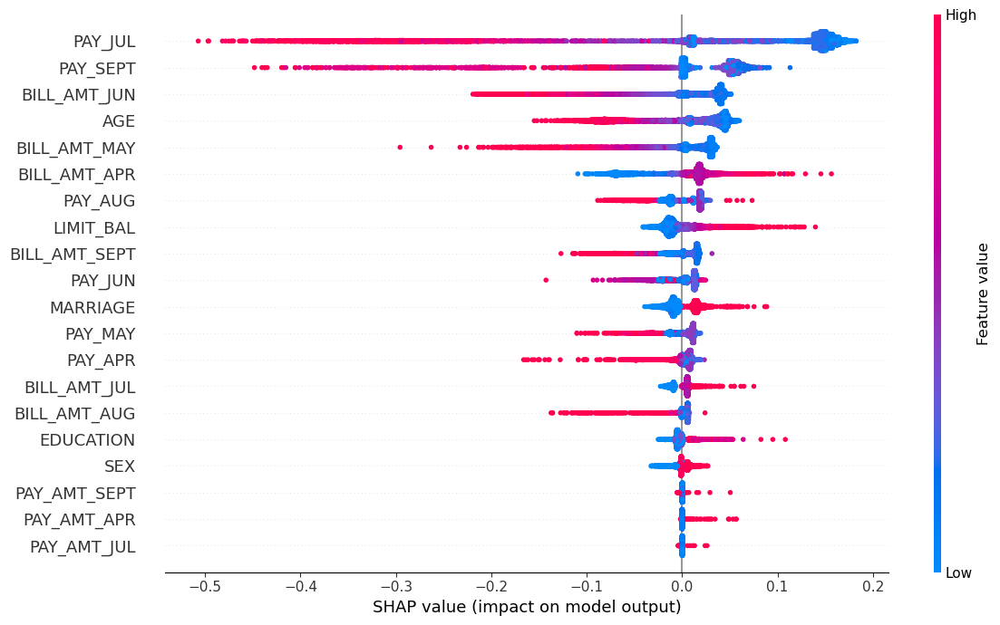

In [ ]:
shap.summary_plot(shapv_reshaped[0],
                  background[:5000, :, 0],
                  feature_names=col.columns, plot_size=(12,7))

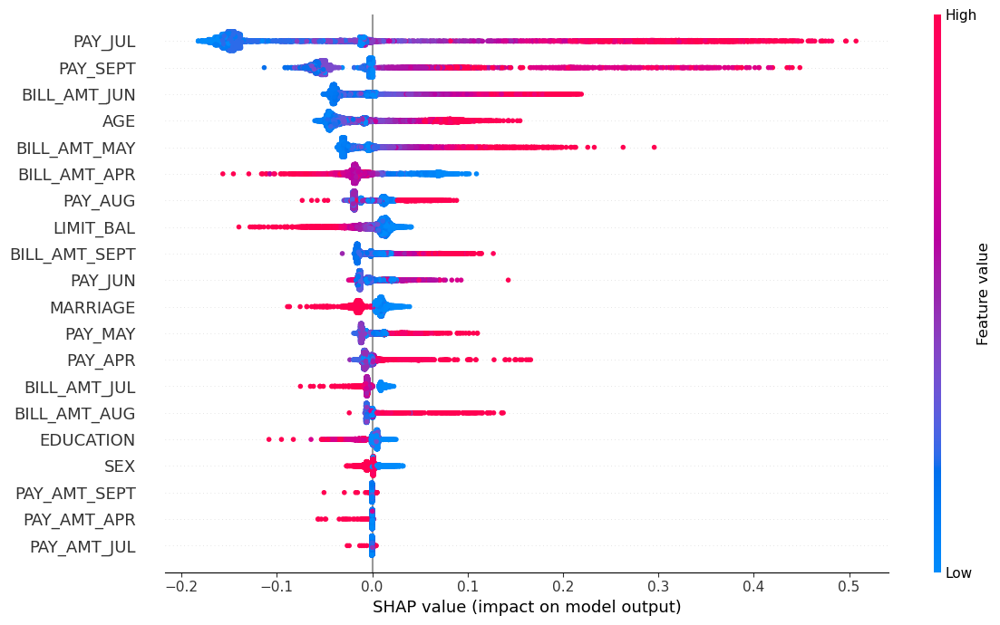

In [ ]:
shap.summary_plot(shapv_reshaped[1],
                  background[:5000, :, 0],
                  feature_names=col.columns, plot_size=(12,7))

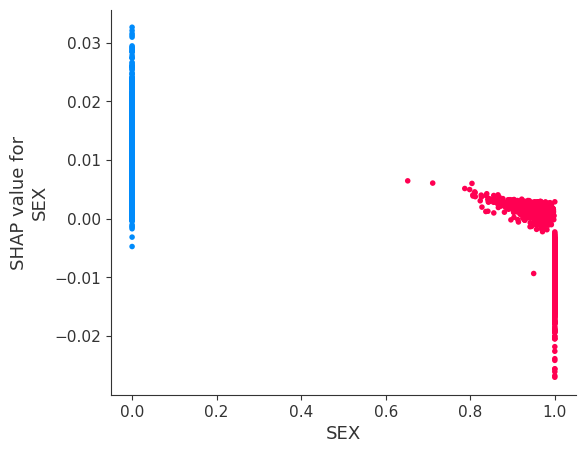

In [ ]:
#class = 0
shap.dependence_plot('SEX', shapv_reshaped[1][:], background[:5000, :, 0],feature_names=col.columns,interaction_index='SEX')


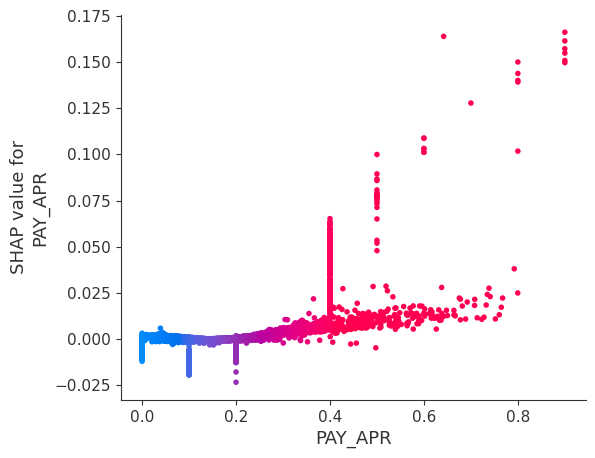

In [ ]:
#class = 0
shap.dependence_plot('PAY_APR', shapv_reshaped[1][:], background[:5000, :, 0],feature_names=col.columns,interaction_index='PAY_APR')


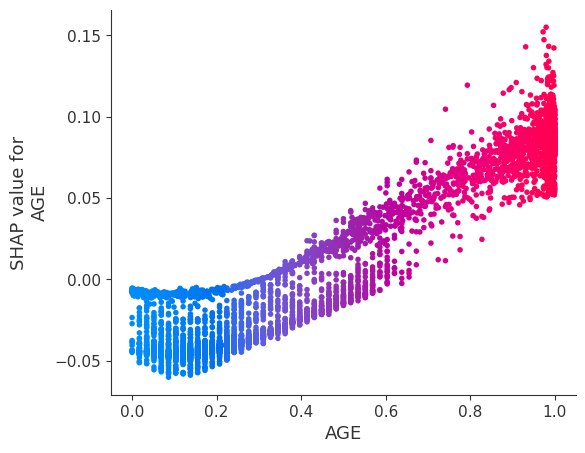

In [ ]:
#class = 0
shap.dependence_plot('AGE', shapv_reshaped[1][:], background[:5000, :, 0],feature_names=col.columns,interaction_index='AGE')


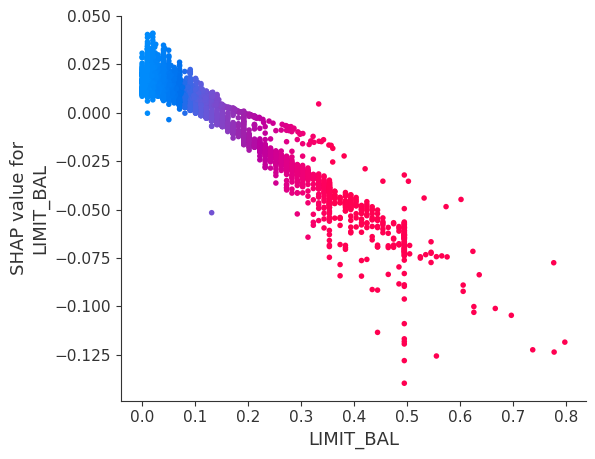

In [ ]:
#class = 0
shap.dependence_plot('LIMIT_BAL', shapv_reshaped[1][:], background[:5000, :, 0],feature_names=col.columns,interaction_index='LIMIT_BAL')


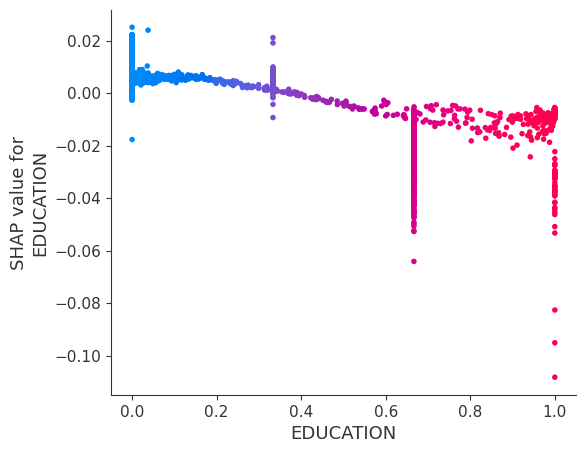

In [ ]:
shap.dependence_plot('EDUCATION', shapv_reshaped[1][:], background[:5000, :, 0],feature_names=col.columns,interaction_index='EDUCATION')


## Identity CNN

In [215]:
import numpy as np
import shap

def evaluate_identity_axiom_repeatability(model, X_test, num_trials=10, sample_size=100):
    # Use the Deep Explainer for Keras models
    # Background dataset should be a representative sample; use the first 100 samples
    background = X_test[:100]  # Ensure it's (100, 71, 1)
    
    # Create the Deep Explainer with the model and background
    explainer = shap.DeepExplainer(model, background)
    
    # Determine sample size based on available data
    num_instances = min(sample_size, X_test.shape[0])

    # Select a random subset of data
    random_indices = np.random.choice(X_test.shape[0], num_instances, replace=False)
    random_sample = X_test[random_indices]  # Shape should be (num_instances, 71, 1)

    violated = 0

    # Iterate through each instance
    for i, instance in enumerate(random_sample):
        shap_values_first = None

        for _ in range(num_trials):
            # Generate SHAP values for the same instance multiple times
            shap_values = explainer.shap_values(instance.reshape(1, 24, 1))  # Shape should be (1, 71, 1)

            if shap_values_first is None:
                shap_values_first = shap_values
            else:
                # Check if the new SHAP values are close to the initial SHAP values
                if not np.allclose(shap_values, shap_values_first, atol=1e-6):
                    violated += 1
                    break

    # Calculate percentage of instances that satisfy the identity axiom
    satisfied = num_instances - violated
    percent_satisfied = (satisfied / num_instances) * 100
    return percent_satisfied

# Apply the function to evaluate your CNN model
identity_axiom_satisfaction = evaluate_identity_axiom_repeatability(mod, X_testt)
print(f"Percentage of Identity Axiom Satisfaction: {identity_axiom_satisfaction}%")


Percentage of Identity Axiom Satisfaction: 100.0%


In [221]:
import numpy as np
import lime
import lime.lime_tabular

def evaluate_identity_axiom_repeatability(model, X_test, num_trials=10, sample_size=100):
    # Reshape the data for LIME
    num_samples = X_test.shape[0]
    flat_X_test = X_test.reshape(num_samples, -1)  # Shape should be (num_samples, 71)

    # Create the LIME explainer
    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data=flat_X_test,
        mode='classification',
        feature_names=[f'Feature {i + 1}' for i in range(71)],
        class_names=['Class 0', 'Class 1'],  # Adjust if different classes are used
        discretize_continuous=True
    )

    num_instances = min(sample_size, X_test.shape[0])
    random_indices = np.random.choice(num_samples, num_instances, replace=False)
    random_sample = flat_X_test[random_indices]

    violated = 0

    for i, instance in enumerate(random_sample):
        lime_values_first = None

        for _ in range(num_trials):
            reshaped_instance = instance.reshape(1, 24, 1)

            # Generate LIME explanation
            explanation = explainer.explain_instance(
                reshaped_instance.flatten(),
                lambda x: model.predict(x.reshape(-1, 24, 1)),
                num_features=10
            )

            # Check for class 0 or class 1 in local_exp
            if 0 in explanation.local_exp:
                lime_values = explanation.local_exp[0]
            elif 1 in explanation.local_exp:
                lime_values = explanation.local_exp[1]
            else:
                print("Class indices not found in local explanation.")
                continue

            if lime_values_first is None:
                lime_values_first = lime_values
            else:
                if not np.allclose(lime_values, lime_values_first, atol=1e-6):
                    violated += 1
                    break

    satisfied = num_instances - violated
    percent_satisfied = (satisfied / num_instances) * 100
    return percent_satisfied

# Evaluate the model
identity_axiom_satisfaction = evaluate_identity_axiom_repeatability(mod, X_testt)
print(f"Percentage of Identity Axiom Satisfaction: {identity_axiom_satisfaction}%")


157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
157/157 ━━━━━━━━

In [225]:
import numpy as np
from sklearn.metrics import accuracy_score

def evaluate_identity_axiom_repeatability(model, X_test, num_trials=10, sample_size=100):
    num_instances = min(sample_size, X_test.shape[0])
    random_indices = np.random.choice(X_test.shape[0], num_instances, replace=False)
    random_sample = X_test[random_indices]  # Shape should be (num_instances, 71, 1)

    violated = 0

    for i, instance in enumerate(random_sample):
        pfi_values_first = None

        for _ in range(num_trials):
            # Generate PFI values by measuring accuracy drop after permuting each feature
            pfi_values = []
            baseline_accuracy = accuracy_score(
                np.argmax(model.predict(instance.reshape(1, 24, 1)), axis=1), 
                np.argmax(model.predict(instance.reshape(1, 24, 1)), axis=1)
            )

            for feature_idx in range(instance.shape[1]):
                permuted_instance = instance.copy()
                permuted_instance[:, feature_idx] = np.random.permutation(permuted_instance[:, feature_idx])
                permuted_accuracy = accuracy_score(
                    np.argmax(model.predict(permuted_instance.reshape(1, 24, 1)), axis=1), 
                    np.argmax(model.predict(instance.reshape(1, 24, 1)), axis=1)
                )
                pfi_values.append(baseline_accuracy - permuted_accuracy)
            
            pfi_values = np.array(pfi_values)

            if pfi_values_first is None:
                pfi_values_first = pfi_values
            else:
                # Check if the new PFI values are close to the initial PFI values
                if not np.allclose(pfi_values, pfi_values_first, atol=1e-6):
                    violated += 1
                    break

    # Calculate percentage of instances that satisfy the identity axiom
    satisfied = num_instances - violated
    percent_satisfied = (satisfied / num_instances) * 100
    return percent_satisfied

# Apply the function to evaluate your CNN model
identity_axiom_satisfaction = evaluate_identity_axiom_repeatability(mod, X_testt)
print(f"Percentage of Identity Axiom Satisfaction: {identity_axiom_satisfaction}%")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

## Stability CNN

In [227]:
import numpy as np
import shap
from sklearn.cluster import KMeans
from sklearn.metrics import jaccard_score

def evaluate_stability_axiom(model, X_test, y_test_encoded, sample_size=100):
    # Use DeepExplainer for a CNN-based model
    background = X_test[:100]  # Representative background dataset
    explainer = shap.DeepExplainer(model, background)

    # Determine the sample size
    num_instances = min(sample_size, len(X_test))

    # Select a random subset of data and corresponding encoded labels
    random_indices = np.random.choice(range(len(X_test)), num_instances, replace=False)
    random_sample = X_test[random_indices]
    random_labels_encoded = y_test_encoded[random_indices]

    # Convert one-hot encoded labels to their original class labels (0 or 1)
    random_labels = np.argmax(random_labels_encoded, axis=1)

    # Generate SHAP values for each instance in the subset
    shap_values = explainer.shap_values(random_sample)

    # For binary classification, focus on the first set of SHAP values
    shap_values = shap_values[0] if isinstance(shap_values, list) else shap_values

    # Flatten SHAP values for each instance to convert 3D to 2D
    flattened_shap_values = shap_values.reshape((num_instances, -1))

    # Calculate initial centroids for k-means based on flattened SHAP values and true labels
    centroid_0 = np.mean([flattened_shap_values[i] for i in range(num_instances) if random_labels[i] == 0], axis=0)
    centroid_1 = np.mean([flattened_shap_values[i] for i in range(num_instances) if random_labels[i] == 1], axis=0)

    # Perform k-means clustering with specified initial centroids
    kmeans = KMeans(n_clusters=2, init=np.array([centroid_0, centroid_1]), n_init=1)
    kmeans.fit(flattened_shap_values)

    # Compute Jaccard similarity between true labels and predicted clusters
    binary_labels = [1 if label == 1 else 0 for label in random_labels]
    jaccard_sim = jaccard_score(binary_labels, kmeans.labels_)
    return jaccard_sim

# Example of using the function:
# Assuming `best_model1` is your trained CNN binary classification model
# `X_testt` is your test dataset and `y_test_encoded` is the corresponding encoded labels
stability_axiom_similarity = evaluate_stability_axiom(mod, X_testt, y_test_encoded)
print(f"Jaccard Similarity for Stability Axiom: {stability_axiom_similarity}")


Jaccard Similarity for Stability Axiom: 0.7894736842105263


In [229]:
import numpy as np
import lime
import lime.lime_tabular
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import jaccard_score
import pandas as pd  # Ensure pandas is imported if using DataFrames

def predict_proba_cnn(model, instances):
    print(f"Shape of instances before reshaping: {instances.shape}")
    # Dynamically reshape based on the number of features
    num_features = instances.shape[1]  
    reshaped_instances = instances.reshape(-1, num_features, 1)  # Reshape to (-1, num_features, 1)
    predictions = model.predict(reshaped_instances)
    return predictions
def evaluate_stability_axiomcnn_with_lime(model, X_testt, y_test, feature_names, num_features, sample_size=100):
    # Convert X_test to numpy array and then flatten
    if isinstance(X_testt, pd.DataFrame):
        X_test_array = X_testt.values.reshape(X_testt.shape[0], -1)
    else:
        X_test_array = X_testt.reshape(X_testt.shape[0], -1)

    # Initialize LIME Explainer
    scaler = StandardScaler()
    X_test_scaled = scaler.fit_transform(X_test_array)
    explainer = lime.lime_tabular.LimeTabularExplainer(X_test_scaled, feature_names=feature_names, discretize_continuous=True)

    num_instances = min(sample_size, len(X_testt))
    random_indices = np.random.choice(len(X_testt), num_instances, replace=False)
    random_sample = X_test_array[random_indices]
    random_labels = y_test[random_indices]

    # Check if y_test is one-hot encoded
    if random_labels.ndim > 1:
        random_labels = np.argmax(random_labels, axis=1)  # Convert to single-dimensional array

    # Generate LIME explanations for each instance in the subset
    lime_values = []
    for row in random_sample:
        row_scaled = scaler.transform([row])[0]
        exp = explainer.explain_instance(row_scaled, lambda x: predict_proba_cnn(model, x), num_features=num_features)
        explanation = [val[1] for val in exp.as_list()]
        lime_values.append(explanation)

    # Convert LIME explanations to NumPy array
    lime_values = np.array(lime_values)

    # Print shapes for debugging
    print(f"Shape of lime_values: {lime_values.shape}")
    print(f"Shape of random_labels: {random_labels.shape}")

    # Ensure that random_labels is binary
    if len(set(random_labels)) > 2:
        raise ValueError("random_labels contains more than two unique values.")

    # Calculate initial centroids for k-means
    if np.any(random_labels == 0):  # Ensure there are instances with label 0
        centroid_0 = np.mean(lime_values[random_labels == 0], axis=0)
    else:
        raise ValueError("No instances found with label 0.")

    if np.any(random_labels == 1):  # Ensure there are instances with label 1
        centroid_1 = np.mean(lime_values[random_labels == 1], axis=0)
    else:
        raise ValueError("No instances found with label 1.")

    # Perform k-means clustering with specified initial centroids
    kmeans = KMeans(n_clusters=2, init=np.array([centroid_0, centroid_1]), n_init=1)
    kmeans.fit(lime_values)

    # Compute Jaccard similarity
    binary_labels = [1 if label == 1 else 0 for label in random_labels]  # Ensure binary format
    jaccard_sim = jaccard_score(binary_labels, kmeans.labels_)
    return jaccard_sim



# Prepare the data
if isinstance(X_testt, pd.DataFrame):
    X_test_flattened = X_testt.values.reshape(X_testt.shape[0], -1)
else:
    X_test_flattened = X_testt.reshape(X_testt.shape[0], -1)

feature_names = ['feature' + str(i) for i in range(X_test_flattened.shape[1])]
num_features = len(feature_names)

# Example usage
stability_axiom_similarity = evaluate_stability_axiomcnn_with_lime(mod, X_testt, y_test_encoded, feature_names, num_features)
print(f"Jaccard Similarity for Stability Axiom with LIME: {stability_axiom_similarity}")


Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Shape of instances be

In [416]:
import numpy as np
import lime
import lime.lime_tabular
from sklearn.preprocessing import StandardScaler
from scipy.stats import spearmanr
import pandas as pd

def predict_proba_cnn(model, instances):
    num_features = instances.shape[1]  
    reshaped_instances = instances.reshape(-1, num_features, 1)  # Reshape to (-1, num_features, 1)
    predictions = model.predict(reshaped_instances)
    return predictions

def evaluate_stability_axiomcnn_with_lime(model, X_testt, feature_names, num_features, sample_size=100):
    # Convert X_test to numpy array and then flatten
    if isinstance(X_testt, pd.DataFrame):
        X_test_array = X_testt.values.reshape(X_testt.shape[0], -1)
    else:
        X_test_array = X_testt.reshape(X_testt.shape[0], -1)

    # Initialize LIME Explainer
    scaler = StandardScaler()
    X_test_scaled = scaler.fit_transform(X_test_array)
    explainer = lime.lime_tabular.LimeTabularExplainer(X_test_scaled, feature_names=feature_names, discretize_continuous=True)

    # Select a subset of instances
    num_instances = min(sample_size, len(X_testt))
    random_indices = np.random.choice(len(X_testt), num_instances, replace=False)
    random_sample = X_test_array[random_indices]

    # Generate LIME explanations for each instance in the subset
    lime_values = []
    for row in random_sample:
        row_scaled = scaler.transform([row])[0]
        exp = explainer.explain_instance(row_scaled, lambda x: predict_proba_cnn(model, x), num_features=num_features)
        explanation = [val[1] for val in exp.as_list()]
        lime_values.append(explanation)

    # Convert LIME explanations to a NumPy array
    lime_values = np.array(lime_values)

    # Calculate distances between pairs of instances and pairs of explanations
    instance_distances = []
    explanation_distances = []

    for i in range(num_instances):
        for j in range(i + 1, num_instances):
            # Distance between instances
            instance_distance = np.linalg.norm(random_sample[i] - random_sample[j])
            instance_distances.append(instance_distance)
            
            # Distance between explanations (LIME values)
            explanation_distance = np.linalg.norm(lime_values[i] - lime_values[j])
            explanation_distances.append(explanation_distance)

    # Compute Spearman correlation for stability
    spearman_corr, _ = spearmanr(instance_distances, explanation_distances)
    return spearman_corr

# Prepare the data
if isinstance(X_testt, pd.DataFrame):
    X_test_flattened = X_testt.values.reshape(X_testt.shape[0], -1)
else:
    X_test_flattened = X_testt.reshape(X_testt.shape[0], -1)

feature_names = ['feature' + str(i) for i in range(X_test_flattened.shape[1])]
num_features = len(feature_names)

# Example usage
stability_axiom_similarity = evaluate_stability_axiomcnn_with_lime(best_model1, X_testt, feature_names, num_features)
print(f"Spearman Correlation for Stability Axiom with LIME: {stability_axiom_similarity}")


157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━

In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score

def evaluate_stability_of_pfi(model, X_test, num_trials=10, sample_size=100):
    num_instances = min(sample_size, X_test.shape[0])
    random_indices = np.random.choice(X_test.shape[0], num_instances, replace=False)
    random_sample = X_test[random_indices]  # Shape should be (num_instances, 71, 1)

    stability_violations = 0

    for instance in random_sample:
        pfi_values_first = None

        for _ in range(num_trials):
            # Generate PFI values by measuring accuracy drop after permuting each feature
            pfi_values = []
            baseline_accuracy = accuracy_score(
                np.argmax(model.predict(instance.reshape(1, 71, 1)), axis=1),
                np.argmax(model.predict(instance.reshape(1, 71, 1)), axis=1)
            )

            for feature_idx in range(instance.shape[1]):
                permuted_instance = instance.copy()
                permuted_instance[:, feature_idx] = np.random.permutation(permuted_instance[:, feature_idx])
                permuted_accuracy = accuracy_score(
                    np.argmax(model.predict(permuted_instance.reshape(1, 71, 1)), axis=1),
                    np.argmax(model.predict(instance.reshape(1, 71, 1)), axis=1)
                )
                pfi_values.append(baseline_accuracy - permuted_accuracy)
            
            pfi_values = np.array(pfi_values)

            if pfi_values_first is None:
                pfi_values_first = pfi_values
            else:
                # Check if the new PFI values are close to the initial PFI values
                if not np.allclose(pfi_values, pfi_values_first, atol=1e-6):
                    stability_violations += 1
                    break

    # Calculate percentage of instances that satisfy the stability criterion
    satisfied = num_instances - stability_violations
    percent_satisfied = (satisfied / num_instances) * 100
    return percent_satisfied

# Apply the function to evaluate your CNN model's PFI stability
stability_axiom_satisfaction = evaluate_stability_of_pfi(best_model1, X_testt)
print(f"Percentage of Stability Axiom Satisfaction: {stability_axiom_satisfaction}%")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━

In [237]:
import numpy as np
from sklearn.metrics import jaccard_score, accuracy_score
from sklearn.cluster import KMeans

def evaluate_stability_axiom_pfi(model, X_testt, y_test, num_trials=10, sample_size=100):
    # Convert X_test to numpy array
    if isinstance(X_testt, pd.DataFrame):
        X_test_array = X_testt.values
    else:
        X_test_array = X_testt

    num_instances = min(sample_size, len(X_test_array))
    random_indices = np.random.choice(len(X_test_array), num_instances, replace=False)
    random_sample = X_test_array[random_indices]
    random_labels = y_test[random_indices]

    # Check if y_test is one-hot encoded
    if random_labels.ndim > 1:
        random_labels = np.argmax(random_labels, axis=1)  # Convert to single-dimensional array

    pfi_values_list = []

    for _ in range(num_trials):
        pfi_values = []
        baseline_accuracy = accuracy_score(
            np.argmax(model.predict(random_sample.reshape(-1, 24, 1)), axis=1), 
            random_labels
        )

        for feature_idx in range(random_sample.shape[1]):
            permuted_sample = random_sample.copy()
            permuted_sample[:, feature_idx] = np.random.permutation(permuted_sample[:, feature_idx])
            permuted_accuracy = accuracy_score(
                np.argmax(model.predict(permuted_sample.reshape(-1, 24, 1)), axis=1), 
                random_labels
            )
            pfi_values.append(baseline_accuracy - permuted_accuracy)
        
        pfi_values_list.append(pfi_values)

    # Convert list of PFI values to a NumPy array for analysis
    pfi_values_array = np.array(pfi_values_list)

    # Calculate stability by comparing PFI values across trials
    centroid = np.mean(pfi_values_array, axis=0)  # Mean PFI values as centroids

    # Perform k-means clustering on the PFI values
    kmeans = KMeans(n_clusters=2, init=np.array([centroid, centroid]), n_init=1)
    kmeans.fit(pfi_values_array)

    # Ensure we only compare labels corresponding to the KMeans results
    # Using only the first num_trials samples for comparison
    if len(kmeans.labels_) != len(random_labels):
        # Adjust the length if needed
        binary_labels = [1 if label == 1 else 0 for label in random_labels[:len(kmeans.labels_)]]
        jaccard_sim = jaccard_score(binary_labels, kmeans.labels_)
    else:
        binary_labels = [1 if label == 1 else 0 for label in random_labels]
        jaccard_sim = jaccard_score(binary_labels, kmeans.labels_)

    return jaccard_sim

# Example usage
stability_axiom_similarity = evaluate_stability_axiom_pfi(mod, X_testt, y_test_encoded)
print(f"Jaccard Similarity for Stability Axiom with PFI: {stability_axiom_similarity}")


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━

In [231]:
import numpy as np
from sklearn.metrics import jaccard_score, accuracy_score
from sklearn.cluster import KMeans

def evaluate_stability_axiom_pfi(model, X_testt, y_test, num_trials=10, sample_size=100):
    if isinstance(X_testt, pd.DataFrame):
        X_test_array = X_testt.values
    else:
        X_test_array = X_testt

    num_instances = min(sample_size, len(X_test_array))
    random_indices = np.random.choice(len(X_test_array), num_instances, replace=False)
    random_sample = X_test_array[random_indices]
    random_labels = y_test[random_indices]

    if random_labels.ndim > 1:
        random_labels = np.argmax(random_labels, axis=1)

    pfi_values_list = []

    for _ in range(num_trials):
        pfi_values = []
        baseline_accuracy = accuracy_score(
            np.argmax(model.predict(random_sample.reshape(-1, 24, 1)), axis=1), 
            random_labels
        )

        for feature_idx in range(random_sample.shape[1]):
            permuted_sample = random_sample.copy()
            permuted_sample[:, feature_idx] = np.random.permutation(permuted_sample[:, feature_idx])
            permuted_accuracy = accuracy_score(
                np.argmax(model.predict(permuted_sample.reshape(-1, 24, 1)), axis=1), 
                random_labels
            )
            pfi_values.append(baseline_accuracy - permuted_accuracy)
        
        pfi_values_list.append(pfi_values)

    pfi_values_array = np.array(pfi_values_list)

    # Separate initialization for centroids
    centroid_1 = np.mean(pfi_values_array, axis=0)
    centroid_2 = centroid_1 + np.random.normal(0, 0.1, centroid_1.shape)  # Small perturbation for second centroid

    kmeans = KMeans(n_clusters=2, init=np.array([centroid_1, centroid_2]), n_init=1)
    kmeans.fit(pfi_values_array)

    binary_labels = [1 if label == 1 else 0 for label in random_labels[:len(kmeans.labels_)]]
    jaccard_sim = jaccard_score(binary_labels, kmeans.labels_)
    
    return jaccard_sim

# Example usage
stability_axiom_similarity = evaluate_stability_axiom_pfi(mod, X_testt, y_test_encoded)
print(f"Jaccard Similarity for Stability Axiom with PFI: {stability_axiom_similarity}")


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━

## Seperability

In [232]:
import numpy as np
import shap
from scipy.spatial.distance import euclidean

def evaluate_separability_axiom(model, X_test, sample_size=100, tolerance=1e-5):
    # Use DeepExplainer for a CNN-based model
    background = X_test[:100]  # Representative background dataset
    explainer = shap.DeepExplainer(model, background)
    
    # Determine the sample size
    num_instances = min(sample_size, len(X_test))

    # Select a random subset of data
    random_indices = np.random.choice(range(len(X_test)), num_instances, replace=False)
    random_sample = X_test[random_indices]

    # Generate SHAP values for each instance in the subset
    shap_values = explainer.shap_values(random_sample)

    # For binary classification, focus on the first set of SHAP values
    shap_values = shap_values[0] if isinstance(shap_values, list) else shap_values

    # Flatten SHAP values for each instance to convert 3D to 2D
    flattened_shap_values = shap_values.reshape((num_instances, -1))

    # Check for duplicate explanations with a tolerance
    violated = 0
    for i in range(num_instances):
        for j in range(i + 1, num_instances):
            if euclidean(flattened_shap_values[i], flattened_shap_values[j]) <= tolerance:
                violated += 1

    # Calculate the percentage of explanations that satisfy the separability axiom
    satisfied = num_instances * (num_instances - 1) / 2 - violated
    percent_satisfied = (satisfied / (num_instances * (num_instances - 1) / 2)) * 100
    return percent_satisfied

# Example usage:
# Assuming `best_model1` is your trained CNN model and `X_testt` is your test dataset
separability_axiom_satisfaction = evaluate_separability_axiom(mod, X_testt)
print(f"Percentage of Separability Axiom Satisfaction: {separability_axiom_satisfaction}%")


Percentage of Separability Axiom Satisfaction: 100.0%


In [239]:
import numpy as np
import lime
import lime.lime_tabular
from scipy.spatial.distance import euclidean
import pandas as pd  # Ensure pandas is imported if using DataFrames

def predict_proba_cnn(model, instances):
    print(f"Shape of instances before reshaping: {instances.shape}")
    num_features = instances.shape[1]
    reshaped_instances = instances.reshape(-1, num_features, 1)  # Reshape to (-1, num_features, 1)
    predictions = model.predict(reshaped_instances)
    return predictions

def evaluate_separability_axiom_lime(model, X_test, feature_names, num_features, sample_size=100, tolerance=1e-5):
    # Convert X_test to numpy array and flatten if needed
    if isinstance(X_test, pd.DataFrame):
        X_test_array = X_test.values.reshape(X_test.shape[0], -1)
    else:
        X_test_array = X_test.reshape(X_test.shape[0], -1)

    # Initialize LIME Explainer (with pre-scaled data)
    explainer = lime.lime_tabular.LimeTabularExplainer(X_test_array, feature_names=feature_names, discretize_continuous=True)

    num_instances = min(sample_size, len(X_test))
    random_indices = np.random.choice(len(X_test), num_instances, replace=False)
    random_sample = X_test_array[random_indices]

    # Generate LIME explanations for each instance in the subset
    lime_values = []
    for row in random_sample:
        exp = explainer.explain_instance(row, lambda x: predict_proba_cnn(model, x), num_features=num_features)
        explanation = [val[1] for val in exp.as_list()]
        lime_values.append(explanation)

    # Convert LIME explanations to a NumPy array for comparison
    lime_values = np.array(lime_values)
    
    # Initialize count for explanations violating separability
    violated = 0
    num_comparisons = num_instances * (num_instances - 1) / 2  # Total pairwise comparisons

    # Check pairwise distances
    for i in range(num_instances):
        for j in range(i + 1, num_instances):
            if euclidean(lime_values[i], lime_values[j]) <= tolerance:
                violated += 1

    # Calculate percentage of separability satisfaction
    satisfied = num_comparisons - violated
    percent_satisfied = (satisfied / num_comparisons) * 100
    return percent_satisfied

# Example usage
# Prepare feature names based on flattened shape of X_test
if isinstance(X_test, pd.DataFrame):
    X_test_flattened = X_test.values.reshape(X_test.shape[0], -1)
else:
    X_test_flattened = X_test.reshape(X_test.shape[0], -1)

feature_names = ['feature' + str(i) for i in range(X_test_flattened.shape[1])]
num_features = len(feature_names)

# Run the separability evaluation
separability_axiom_satisfaction = evaluate_separability_axiom_lime(mod, X_test, feature_names, num_features)
print(f"Percentage of Separability Axiom Satisfaction (LIME): {separability_axiom_satisfaction}%")


Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Shape of instances before reshaping: (5000, 24)
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Shape of instances be

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score
from scipy.spatial.distance import euclidean

def evaluate_separability_axiom_pfi(model, X_test, sample_size=50):
    # Convert X_test to numpy array if it is a DataFrame
    if isinstance(X_test, pd.DataFrame):
        X_test_array = X_test.values
    else:
        X_test_array = X_test

    # Select a random subset of the data
    num_instances = min(sample_size, len(X_test_array))
    random_indices = np.random.choice(len(X_test_array), num_instances, replace=False)
    random_sample = X_test_array[random_indices]

    explanations = []
    baseline_predictions = model.predict(random_sample.reshape(-1, 24, 1))

    # Calculate PFI values for each feature for each instance
    for instance in random_sample:
        instance_pfi_values = []
        baseline_prediction = model.predict(instance.reshape(1, 24, 1))
        
        for feature_idx in range(instance.shape[0]):
            permuted_instance = instance.copy()
            permuted_instance[feature_idx] = np.random.permutation([permuted_instance[feature_idx]])
            permuted_prediction = model.predict(permuted_instance.reshape(1, 71, 1))
            
            # Calculate the difference in accuracy as PFI value
            pfi_value = accuracy_score(
                np.argmax(baseline_prediction, axis=1),
                np.argmax(permuted_prediction, axis=1)
            )
            instance_pfi_values.append(pfi_value)
        
        explanations.append(instance_pfi_values)

    # Convert explanations to a numpy array
    explanations = np.array(explanations)
    print(f"Generated explanations matrix shape: {explanations.shape}")  # Debugging print

    # Check for separability
    violations = 0
    num_comparisons = len(random_sample) * (len(random_sample) - 1) / 2

    for i in range(len(random_sample)):
        for j in range(i + 1, len(random_sample)):
            # Flatten the instances before calculating the distance
            instance_distance = euclidean(random_sample[i].flatten(), random_sample[j].flatten())
            explanation_distance = euclidean(explanations[i], explanations[j])

            # If instances are different but explanations are identical (or very close)
            if instance_distance > 0 and explanation_distance == 0:
                violations += 1

    # Calculate percentage of explanations satisfying separability
    percent_satisfied = ((num_comparisons - violations) / num_comparisons) * 100
    print(f"Total comparisons: {num_comparisons}, Violations: {violations}")
    print(f"Percent of explanations satisfying separability: {percent_satisfied}%")
    return percent_satisfied

# Example usage
separability_score = evaluate_separability_axiom_pfi(best_model1, X_testt)
print(f"Percent of explanations satisfying separability: {separability_score}%")


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━

In [351]:
X_test

,loan_amnt,term,int_rate,installment,emp_length,annual_inc,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies,sub_grade_A2,sub_grade_A3,sub_grade_A4,sub_grade_A5,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,...,sub_grade_G3,sub_grade_G4,sub_grade_G5,verification_status_Source Verified,verification_status_Verified,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,initial_list_status_w,application_type_INDIVIDUAL,application_type_JOINT,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT,zip_code
202533,0.00,0.01,0.43,0.01,0.88,0.00,0.00,0.43,0.00,0.18,0.00,0.01,0.24,1.00,0.19,0.00,0.00,0.01,0.00,0.04,0.00,0.02,0.00,0.00,0.00,...,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.99,0.00,0.00,0.00,0.07,0.85
138319,0.66,0.31,0.08,0.51,0.04,0.01,0.01,0.04,0.02,0.00,0.06,0.04,0.14,0.39,0.00,0.00,0.01,0.00,0.01,0.07,0.00,0.00,0.00,0.01,0.00,...,0.00,0.01,0.01,0.01,0.98,0.00,1.00,0.00,0.01,0.01,0.00,0.00,0.00,0.00,0.04,0.02,0.00,0.00,0.85,0.99,0.01,0.00,0.00,0.06,0.75
555357,0.44,0.00,0.03,0.35,1.00,0.01,0.03,0.72,0.07,0.00,0.01,0.05,0.17,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.75
206835,0.50,0.07,0.20,0.64,0.02,0.01,0.02,0.17,0.01,0.00,0.00,0.13,0.24,0.95,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,0.00,...,0.00,0.00,0.00,0.00,0.98,0.00,1.00,0.00,0.01,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.12,0.99,0.01,0.00,0.00,0.02,0.81
350770,0.55,0.00,0.33,0.49,1.00,0.01,0.06,0.75,0.30,0.00,0.01,0.03,0.34,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,...,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93314,0.67,0.25,0.00,0.07,0.19,0.18,0.01,0.01,0.01,0.18,0.97,0.02,0.03,0.05,0.00,0.67,0.99,0.28,0.65,0.82,0.00,0.00,0.00,0.52,0.00,...,0.70,0.84,0.94,0.00,1.00,0.00,0.88,0.24,0.86,0.99,0.30,0.00,0.05,0.12,0.65,1.00,0.66,0.95,0.91,0.99,0.77,0.25,0.14,0.54,0.22
409389,0.13,0.00,0.35,0.12,1.00,0.01,0.04,0.81,0.06,1.00,0.00,0.05,0.19,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00
241776,0.29,1.00,0.65,0.21,0.60,0.01,0.08,0.91,0.09,0.00,0.01,0.05,0.09,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.12
110240,0.01,1.00,0.23,0.00,1.00,0.00,0.01,0.84,0.91,0.01,0.00,0.05,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,...,0.00,0.00,0.00,1.00,0.00,1.00,0.01,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.99,0.99,0.00,0.00,0.00,1.00,0.81


In [ ]:
import numpy as np
from scipy.spatial.distance import euclidean
import pandas as pd

def predict_proba_cnn(model, instances):
    print(f"Shape of instances before reshaping: {instances.shape}")
    num_features = instances.shape[1]
    reshaped_instances = instances.reshape(-1, num_features, 1)  # Reshape to (-1, num_features, 1)
    predictions = model.predict(reshaped_instances)
    return predictions

def compute_pfi_scores(model, X, y, num_features):
    # Reshape X to the expected 3D shape (samples, 71, 1)
    X_reshaped = X.reshape(-1, 24, 1)
    
    # Calculate the baseline performance with unperturbed data
    baseline_predictions = model.predict(X_reshaped)
    
    # Determine if y is one-hot encoded or integer labels
    if y.ndim == 2:  # Assuming one-hot encoding if y has two dimensions
        y_true = np.argmax(y, axis=1)
    else:
        y_true = y
    
    # Convert baseline predictions to class labels if necessary
    if baseline_predictions.ndim == 2:
        y_pred = np.argmax(baseline_predictions, axis=1)
    else:
        y_pred = baseline_predictions

    # Calculate baseline accuracy
    baseline_accuracy = np.mean(y_pred == y_true)
    
    # Initialize an array for PFI scores
    pfi_scores = np.zeros((X.shape[0], num_features))
    
    for feature_idx in range(num_features):
        X_permuted = X.copy()
        np.random.shuffle(X_permuted[:, feature_idx])  # Permute the feature values
        
        # Reshape permuted data to match the model's expected input shape
        X_permuted_reshaped = X_permuted.reshape(-1, 24, 1)
        permuted_predictions = model.predict(X_permuted_reshaped)
        
        # Convert permuted predictions to class labels if necessary
        if permuted_predictions.ndim == 2:
            y_perm_pred = np.argmax(permuted_predictions, axis=1)
        else:
            y_perm_pred = permuted_predictions
        
        # Calculate permuted accuracy
        permuted_accuracy = np.mean(y_perm_pred == y_true)
        
        # Calculate the feature importance as the decrease in accuracy
        pfi_scores[:, feature_idx] = baseline_accuracy - permuted_accuracy
    
    return pfi_scores

def evaluate_separability_axiom_pfi(model, X_test, y_test, feature_names, num_features, sample_size=100, tolerance=1e-5):
    # Convert X_test to numpy array and flatten if needed
    if isinstance(X_test, pd.DataFrame):
        X_test_array = X_test.values.reshape(X_test.shape[0], -1)
    else:
        X_test_array = X_test.reshape(X_test.shape[0], -1)
    
    num_instances = min(sample_size, len(X_test))
    random_indices = np.random.choice(len(X_test), num_instances, replace=False)
    random_sample = X_test_array[random_indices]
    
    # Convert y_test to a numpy array if it's a pandas Series or DataFrame
    if isinstance(y_test, (pd.Series, pd.DataFrame)):
        y_test = y_test.reset_index(drop=True).values
    random_labels = y_test[random_indices]
    
    # Compute PFI scores for the selected sample
    pfi_values = compute_pfi_scores(model, random_sample, random_labels, num_features)
    
    violated = 0
    num_comparisons = num_instances * (num_instances - 1) / 2
    
    for i in range(num_instances):
        for j in range(i + 1, num_instances):
            distance = euclidean(pfi_values[i], pfi_values[j])
            if distance <= tolerance:
                violated += 1
                print(f"Violation between instance {i} and {j}: Distance = {distance}")
    
    satisfied = num_comparisons - violated
    percent_satisfied = (satisfied / num_comparisons) * 100
    return percent_satisfied

# Example usage
# Assuming X_test and y_test are already defined
# Replace '71' with the actual number of features your model expects
if isinstance(X_test, pd.DataFrame):
    X_test_flattened = X_test.values.reshape(X_test.shape[0], -1)
else:
    X_test_flattened = X_test.reshape(X_test.shape[0], -1)

feature_names = ['feature' + str(i) for i in range(X_test_flattened.shape[1])]
num_features = len(feature_names)

# Run the separability evaluation
separability_axiom_satisfaction = evaluate_separability_axiom_pfi(
    mod, X_test, y_test, feature_names, num_features
)
print(f"Percentage of Separability Axiom Satisfaction (PFI): {separability_axiom_satisfaction}%")


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

In [241]:
import numpy as np
from scipy.spatial.distance import euclidean
import pandas as pd

def predict_proba_cnn(model, instances):
    print(f"Shape of instances before reshaping: {instances.shape}")
    num_features = instances.shape[1]
    reshaped_instances = instances.reshape(-1, num_features, 1)
    predictions = model.predict(reshaped_instances)
    return predictions

def compute_pfi_scores(model, X, y, num_features):
    X_reshaped = X.reshape(-1, 24, 1)  # Adjust based on input shape
    baseline_predictions = model.predict(X_reshaped)
    
    if y.ndim > 1 and y.shape[1] > 1:
        y_true = np.argmax(y, axis=1)
    else:
        y_true = y

    y_pred = np.argmax(baseline_predictions, axis=1) if baseline_predictions.ndim > 1 else baseline_predictions
    baseline_accuracy = np.mean(y_pred == y_true)

    pfi_scores = np.zeros((X.shape[0], num_features))
    
    for feature_idx in range(num_features):
        X_permuted = X.copy()
        np.random.shuffle(X_permuted[:, feature_idx])
        
        X_permuted_reshaped = X_permuted.reshape(-1, 24, 1)
        permuted_predictions = model.predict(X_permuted_reshaped)
        
        y_perm_pred = np.argmax(permuted_predictions, axis=1) if permuted_predictions.ndim > 1 else permuted_predictions
        permuted_accuracy = np.mean(y_perm_pred == y_true)
        
        pfi_scores[:, feature_idx] = baseline_accuracy - permuted_accuracy
    
    return pfi_scores

def evaluate_separability_axiom_pfi(model, X_test, y_test, feature_names, num_features, sample_size=100, tolerance=1e-5):
    X_test_array = X_test.reshape(X_test.shape[0], -1) if not isinstance(X_test, pd.DataFrame) else X_test.values.reshape(X_test.shape[0], -1)
    num_instances = min(sample_size, len(X_test))
    random_indices = np.random.choice(len(X_test), num_instances, replace=False)
    random_sample = X_test_array[random_indices]
    random_labels = y_test[random_indices] if isinstance(y_test, np.ndarray) else y_test.to_numpy()[random_indices]
    
    pfi_values = compute_pfi_scores(model, random_sample, random_labels, num_features)
    
    violated = 0
    num_comparisons = num_instances * (num_instances - 1) / 2
    
    for i in range(num_instances):
        for j in range(i + 1, num_instances):
            distance = euclidean(pfi_values[i], pfi_values[j])
            if distance <= tolerance:
                violated += 1
    
    satisfied = num_comparisons - violated
    percent_satisfied = (satisfied / num_comparisons) * 100
    return percent_satisfied

# Usage
X_test_flattened = X_test.reshape(X_test.shape[0], -1) if not isinstance(X_test, pd.DataFrame) else X_test.values.reshape(X_test.shape[0], -1)
feature_names = ['feature' + str(i) for i in range(X_test_flattened.shape[1])]
num_features = len(feature_names)

separability_axiom_satisfaction = evaluate_separability_axiom_pfi(
    mod, X_test, y_test_encoded, feature_names, num_features
)
print(f"Percentage of Separability Axiom Satisfaction (PFI): {separability_axiom_satisfaction}%")


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Percentage of Separability Axiom Satisfaction (PFI